# 6CS012 – Final Portfolio Assessment 2026
## Part II: Vision Tasks — Image Classification with CNN
### Dataset: Flower Classification (7 Classes | 11,531 Images)
**Classes:** daisy · dandelion · lily · orchid · rose · sunflower · tulip  
**Split:** Train 70% (8069) | Val 20% (2306) | Test 10% (1156)

---
**Setup checklist before running:**
1. `Runtime → Change runtime type → T4 GPU`
2. Mount Google Drive (Cell 1)
3. Verify `DATASET_ROOT` path in Cell 2

## 0. Mount Google Drive & Configure Paths

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
print('Google Drive mounted!')

Mounted at /content/drive
Google Drive mounted!


In [ ]:
import os


DATASET_ROOT = '/content/drive/MyDrive/AI ML/part2FlowerClassification/flowers'
SAVE_DIR     = '/content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels'
os.makedirs(SAVE_DIR, exist_ok=True)

TRAIN_DIR = os.path.join(DATASET_ROOT, 'train')
VAL_DIR   = os.path.join(DATASET_ROOT, 'val')
TEST_DIR  = os.path.join(DATASET_ROOT, 'test')

for split, path in [('train', TRAIN_DIR), ('val', VAL_DIR), ('test', TEST_DIR)]:
    classes = sorted(os.listdir(path))
    print(f'{split:>5}: {len(classes)} classes → {classes}')

print(f'\nModel checkpoints will save to: {SAVE_DIR}')

train: 7 classes → ['daisy', 'dandelion', 'lily', 'orchid', 'rose', 'sunflower', 'tulip']
  val: 7 classes → ['daisy', 'dandelion', 'lily', 'orchid', 'rose', 'sunflower', 'tulip']
 test: 7 classes → ['daisy', 'dandelion', 'lily', 'orchid', 'rose', 'sunflower', 'tulip']

Model checkpoints will save to: /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels


## 1. Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import random, time, warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix
from PIL import Image

print(f'TensorFlow : {tf.__version__}')
print(f'GPU found  : {len(tf.config.list_physical_devices("GPU")) > 0}')

TensorFlow : 2.20.0
GPU found  : False


---
## 2. Data Understanding, Analysis & Visualisation

In [ ]:
CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))
NUM_CLASSES = len(CLASS_NAMES)
print(f'Classes ({NUM_CLASSES}): {CLASS_NAMES}')

Classes (7): ['daisy', 'dandelion', 'lily', 'orchid', 'rose', 'sunflower', 'tulip']


In [ ]:
# ── Count images per class per split ──
split_dirs = {'train': TRAIN_DIR, 'val': VAL_DIR, 'test': TEST_DIR}
counts = {cls: {} for cls in CLASS_NAMES}

for split, path in split_dirs.items():
    for cls in CLASS_NAMES:
        cls_path = os.path.join(path, cls)
        n = len([f for f in os.listdir(cls_path)
                 if f.lower().endswith(('.jpg','.jpeg','.png'))])
        counts[cls][split] = n

print(f'{"Class":<15} {"Train":>8} {"Val":>8} {"Test":>8} {"Total":>8}')
print('-'*52)
grand = 0
for cls in CLASS_NAMES:
    t, v, te = counts[cls]['train'], counts[cls]['val'], counts[cls]['test']
    tot = t+v+te; grand += tot
    print(f'{cls:<15} {t:>8} {v:>8} {te:>8} {tot:>8}')
print('-'*52)
print(f'{"TOTAL":<15}',
      f'{sum(counts[c]["train"] for c in CLASS_NAMES):>8}',
      f'{sum(counts[c]["val"]   for c in CLASS_NAMES):>8}',
      f'{sum(counts[c]["test"]  for c in CLASS_NAMES):>8}',
      f'{grand:>8}')

Class              Train      Val     Test    Total
----------------------------------------------------
daisy               1231      352      176     1759
dandelion           1046      299      150     1495
lily                1132      324      162     1618
orchid              1295      370      186     1851
rose                1042      298      149     1489
sunflower           1199      352      172     1723
tulip               1124      321      161     1606
----------------------------------------------------
TOTAL               8069     2316     1156    11541


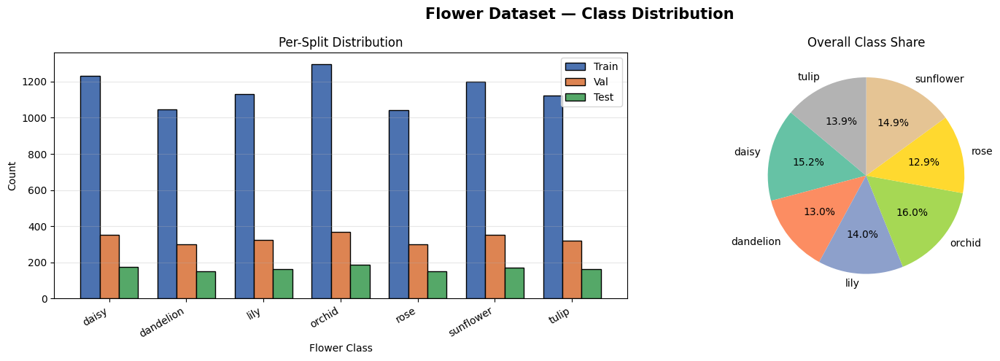

In [ ]:
x, width = np.arange(NUM_CLASSES), 0.25
splits = ['train','val','test']
colors_sp = ['#4C72B0','#DD8452','#55A868']

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Flower Dataset — Class Distribution', fontsize=15, fontweight='bold')

for i,(sp,col) in enumerate(zip(splits,colors_sp)):
    vals = [counts[cls][sp] for cls in CLASS_NAMES]
    axes[0].bar(x+i*width, vals, width, label=sp.capitalize(), color=col, edgecolor='black')
axes[0].set_xticks(x+width); axes[0].set_xticklabels(CLASS_NAMES, rotation=30, ha='right')
axes[0].set_xlabel('Flower Class'); axes[0].set_ylabel('Count')
axes[0].set_title('Per-Split Distribution'); axes[0].legend(); axes[0].grid(axis='y',alpha=0.3)

totals = [sum(counts[cls].values()) for cls in CLASS_NAMES]
axes[1].pie(totals, labels=CLASS_NAMES, autopct='%1.1f%%',
            colors=plt.cm.Set2(np.linspace(0,1,NUM_CLASSES)), startangle=140)
axes[1].set_title('Overall Class Share')
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR,'../class_distribution.png'), dpi=150, bbox_inches='tight')
plt.show()

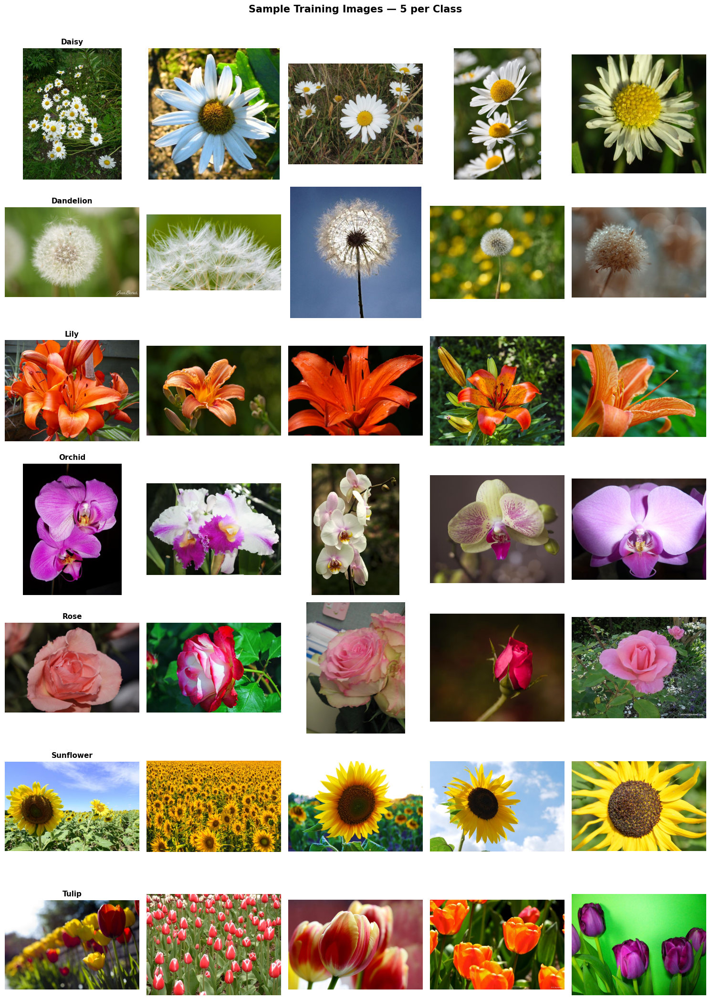

In [ ]:
fig, axes = plt.subplots(NUM_CLASSES, 5, figsize=(15, 3*NUM_CLASSES))
fig.suptitle('Sample Training Images — 5 per Class', fontsize=15, fontweight='bold', y=1.01)
for row, cls in enumerate(CLASS_NAMES):
    cls_path = os.path.join(TRAIN_DIR, cls)
    files = random.sample(os.listdir(cls_path), 5)
    for col, fname in enumerate(files):
        img = mpimg.imread(os.path.join(cls_path, fname))
        axes[row][col].imshow(img); axes[row][col].axis('off')
        if col == 0:
            axes[row][col].set_title(cls.capitalize(), fontsize=11, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR,'../sample_images.png'), dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
widths, heights = [], []
for cls in CLASS_NAMES:
    for fname in os.listdir(os.path.join(TRAIN_DIR,cls))[:25]:
        try:
            with Image.open(os.path.join(TRAIN_DIR,cls,fname)) as im:
                widths.append(im.size[0]); heights.append(im.size[1])
        except: pass
print(f'Width  mean={np.mean(widths):.0f} std={np.std(widths):.0f} min={np.min(widths)} max={np.max(widths)}')
print(f'Height mean={np.mean(heights):.0f} std={np.std(heights):.0f} min={np.min(heights)} max={np.max(heights)}')
print('\n→ All images will be resized to 128×128 for Part A training.')

Width  mean=657 std=115 min=360 max=889
Height mean=531 std=97 min=333 max=1024

→ All images will be resized to 128×128 for Part A training.


---
## 3. Data Generators & Augmentation

In [ ]:
IMG_SIZE   = (128, 128)
BATCH_SIZE = 32
SEED       = 42

train_datagen = ImageDataGenerator(
    rescale=1./255, rotation_range=30,
    width_shift_range=0.2, height_shift_range=0.2,
    shear_range=0.15, zoom_range=0.2,
    horizontal_flip=True, fill_mode='nearest'
)
test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', seed=SEED, shuffle=True
)
val_gen = test_datagen.flow_from_directory(
    VAL_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', seed=SEED, shuffle=False
)
test_gen = test_datagen.flow_from_directory(
    TEST_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', seed=SEED, shuffle=False
)
print(f'Train={train_gen.n} | Val={val_gen.n} | Test={test_gen.n}')
print(f'Class map: {train_gen.class_indices}')

Found 8069 images belonging to 7 classes.
Found 2316 images belonging to 7 classes.
Found 1156 images belonging to 7 classes.
Train=8069 | Val=2316 | Test=1156
Class map: {'daisy': 0, 'dandelion': 1, 'lily': 2, 'orchid': 3, 'rose': 4, 'sunflower': 5, 'tulip': 6}


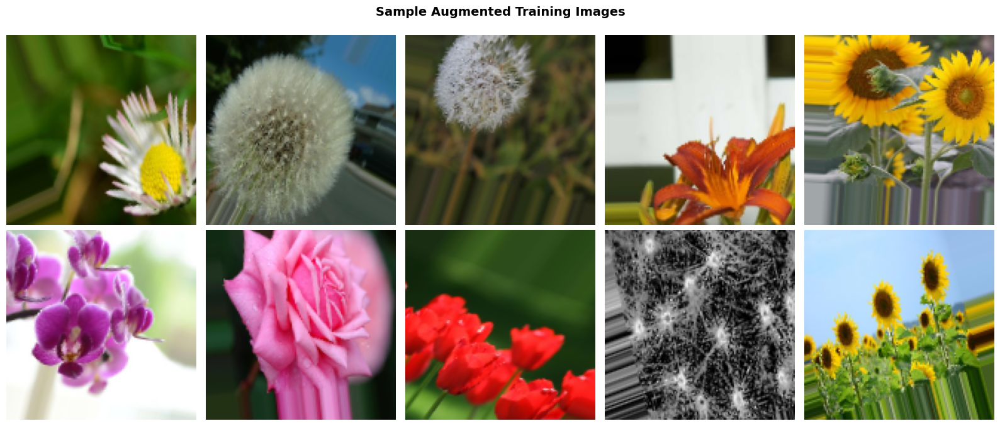

In [ ]:
aug_batch, _ = next(train_gen)
fig, axes = plt.subplots(2, 5, figsize=(16, 7))
fig.suptitle('Sample Augmented Training Images', fontsize=14, fontweight='bold')
for i, ax in enumerate(axes.flat):
    ax.imshow(aug_batch[i]); ax.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR,'../augmented_samples.png'), dpi=150, bbox_inches='tight')
plt.show()

---
## Part A — CNN from Scratch
### 4. Baseline CNN  (3 Conv-Pool blocks + 3 FC layers)
> **ModelCheckpoint saves best epoch weights to Drive as `.h5`  
> so you never lose progress if Colab disconnects.**

In [ ]:
def build_baseline_cnn(num_classes, input_shape=(128,128,3)):
    """Baseline CNN — 3 Conv-Pool blocks + 3 Dense layers."""
    m = models.Sequential(name='Baseline_CNN')
    # Block 1: 32 filters, 3×3 kernel, ReLU activation
    m.add(layers.Conv2D(32,(3,3),activation='relu',padding='same',input_shape=input_shape))
    m.add(layers.MaxPooling2D((2,2)))
    # Block 2: 64 filters
    m.add(layers.Conv2D(64,(3,3),activation='relu',padding='same'))
    m.add(layers.MaxPooling2D((2,2)))
    # Block 3: 128 filters
    m.add(layers.Conv2D(128,(3,3),activation='relu',padding='same'))
    m.add(layers.MaxPooling2D((2,2)))
    # FC head
    m.add(layers.Flatten())
    m.add(layers.Dense(512, activation='relu'))
    m.add(layers.Dense(256, activation='relu'))
    m.add(layers.Dense(128, activation='relu'))
    m.add(layers.Dense(num_classes, activation='softmax'))
    return m

baseline_model = build_baseline_cnn(NUM_CLASSES)
baseline_model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss='categorical_crossentropy', metrics=['accuracy']
)
baseline_model.summary()

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    16,777,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,036,103 (64.99 MB)

 Trainable params: 17,036,103 (64.99 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
BASELINE_H5 = os.path.join(SAVE_DIR, 'baseline_cnn_best.h5')

cb_baseline = [
    ModelCheckpoint(
        filepath=BASELINE_H5, monitor='val_accuracy',
        save_best_only=True, save_weights_only=False, verbose=1
    ),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
]

start = time.time()
history_baseline = baseline_model.fit(
    train_gen, epochs=25, validation_data=val_gen, callbacks=cb_baseline, verbose=1
)
baseline_time = time.time() - start
print(f'\nTraining time : {baseline_time/60:.1f} min')
print(f'Saved to      : {BASELINE_H5}')

Epoch 1/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.4995 - loss: 1.3013
Epoch 1: val_accuracy improved from None to 0.75734, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 1: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 887s 3s/step - accuracy: 0.6219 - loss: 1.0356 - val_accuracy: 0.7573 - val_loss: 0.6576 - learning_rate: 0.0010
Epoch 2/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step - accuracy: 0.7350 - loss: 0.7506
Epoch 2: val_accuracy did not improve from 0.75734
253/253 ━━━━━━━━━━━━━━━━━━━━ 92s 364ms/step - accuracy: 0.7523 - loss: 0.7051 - val_accuracy: 0.7526 - val_loss: 0.8007 - learning_rate: 0.0010
Epoch 3/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step - accuracy: 0.7661 - loss: 0.6880
Epoch 3: val_accuracy improved from 0.75734 to 0.79706, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 3: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 92s 366ms/step - accuracy: 0.7835 - loss: 0.6412 - val_accuracy: 0.7971 - val_loss: 0.5978 - learning_rate: 0.0010
Epoch 4/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step - accuracy: 0.8072 - loss: 0.5541
Epoch 4: val_accuracy improved from 0.79706 to 0.85104, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 4: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 105s 406ms/step - accuracy: 0.8062 - loss: 0.5581 - val_accuracy: 0.8510 - val_loss: 0.4359 - learning_rate: 0.0010
Epoch 5/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step - accuracy: 0.8341 - loss: 0.4935
Epoch 5: val_accuracy improved from 0.85104 to 0.87651, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 5: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 407ms/step - accuracy: 0.8365 - loss: 0.4769 - val_accuracy: 0.8765 - val_loss: 0.3647 - learning_rate: 0.0010
Epoch 6/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step - accuracy: 0.8437 - loss: 0.4394
Epoch 6: val_accuracy improved from 0.87651 to 0.89421, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 6: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 407ms/step - accuracy: 0.8419 - loss: 0.4450 - val_accuracy: 0.8942 - val_loss: 0.3184 - learning_rate: 0.0010
Epoch 7/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step - accuracy: 0.8450 - loss: 0.4549
Epoch 7: val_accuracy did not improve from 0.89421
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 398ms/step - accuracy: 0.8514 - loss: 0.4365 - val_accuracy: 0.8942 - val_loss: 0.3106 - learning_rate: 0.0010
Epoch 8/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step - accuracy: 0.8711 - loss: 0.3745
Epoch 8: val_accuracy did not improve from 0.89421
253/253 ━━━━━━━━━━━━━━━━━━━━ 90s 357ms/step - accuracy: 0.8736 - loss: 0.3661 - val_accuracy: 0.8895 - val_loss: 0.3242 - learning_rate: 0.0010
Epoch 9/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step - accuracy: 0.8842 - loss: 0.3472
Epoch 9: val_accuracy improved from 0.89421 to 0.90458, saving model to /con


Epoch 9: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 92s 366ms/step - accuracy: 0.8856 - loss: 0.3399 - val_accuracy: 0.9046 - val_loss: 0.2900 - learning_rate: 0.0010
Epoch 10/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step - accuracy: 0.8888 - loss: 0.3359
Epoch 10: val_accuracy improved from 0.90458 to 0.90587, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 10: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 406ms/step - accuracy: 0.8890 - loss: 0.3323 - val_accuracy: 0.9059 - val_loss: 0.2647 - learning_rate: 0.0010
Epoch 11/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step - accuracy: 0.8995 - loss: 0.2959
Epoch 11: val_accuracy improved from 0.90587 to 0.92185, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 11: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 408ms/step - accuracy: 0.9042 - loss: 0.2820 - val_accuracy: 0.9218 - val_loss: 0.2446 - learning_rate: 0.0010
Epoch 12/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step - accuracy: 0.9026 - loss: 0.2828
Epoch 12: val_accuracy improved from 0.92185 to 0.93437, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 12: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 400ms/step - accuracy: 0.9031 - loss: 0.2845 - val_accuracy: 0.9344 - val_loss: 0.2084 - learning_rate: 0.0010
Epoch 13/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step - accuracy: 0.9139 - loss: 0.2670
Epoch 13: val_accuracy did not improve from 0.93437
253/253 ━━━━━━━━━━━━━━━━━━━━ 100s 395ms/step - accuracy: 0.9113 - loss: 0.2643 - val_accuracy: 0.9223 - val_loss: 0.2379 - learning_rate: 0.0010
Epoch 14/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - accuracy: 0.9216 - loss: 0.2341
Epoch 14: val_accuracy improved from 0.93437 to 0.93480, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 14: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 97s 382ms/step - accuracy: 0.9203 - loss: 0.2389 - val_accuracy: 0.9348 - val_loss: 0.2003 - learning_rate: 0.0010
Epoch 15/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step - accuracy: 0.9222 - loss: 0.2226
Epoch 15: val_accuracy did not improve from 0.93480
253/253 ━━━━━━━━━━━━━━━━━━━━ 98s 387ms/step - accuracy: 0.9204 - loss: 0.2327 - val_accuracy: 0.9344 - val_loss: 0.2032 - learning_rate: 0.0010
Epoch 16/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - accuracy: 0.9255 - loss: 0.2247
Epoch 16: val_accuracy improved from 0.93480 to 0.93782, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 16: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 92s 363ms/step - accuracy: 0.9213 - loss: 0.2373 - val_accuracy: 0.9378 - val_loss: 0.1846 - learning_rate: 0.0010
Epoch 17/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - accuracy: 0.9371 - loss: 0.1927
Epoch 17: val_accuracy improved from 0.93782 to 0.94257, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 17: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 398ms/step - accuracy: 0.9307 - loss: 0.2023 - val_accuracy: 0.9426 - val_loss: 0.1825 - learning_rate: 0.0010
Epoch 18/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - accuracy: 0.9192 - loss: 0.2343
Epoch 18: val_accuracy did not improve from 0.94257
253/253 ━━━━━━━━━━━━━━━━━━━━ 97s 383ms/step - accuracy: 0.9263 - loss: 0.2141 - val_accuracy: 0.9344 - val_loss: 0.1862 - learning_rate: 0.0010
Epoch 19/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - accuracy: 0.9325 - loss: 0.1981
Epoch 19: val_accuracy improved from 0.94257 to 0.94732, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5



Epoch 19: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 98s 387ms/step - accuracy: 0.9332 - loss: 0.1943 - val_accuracy: 0.9473 - val_loss: 0.1546 - learning_rate: 0.0010
Epoch 20/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - accuracy: 0.9411 - loss: 0.1804
Epoch 20: val_accuracy did not improve from 0.94732
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 401ms/step - accuracy: 0.9369 - loss: 0.1900 - val_accuracy: 0.9370 - val_loss: 0.2031 - learning_rate: 0.0010
Epoch 21/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step - accuracy: 0.9414 - loss: 0.1759
Epoch 21: val_accuracy did not improve from 0.94732
253/253 ━━━━━━━━━━━━━━━━━━━━ 93s 366ms/step - accuracy: 0.9405 - loss: 0.1806 - val_accuracy: 0.9396 - val_loss: 0.1782 - learning_rate: 0.0010
Epoch 22/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - accuracy: 0.9384 - loss: 0.1736
Epoch 22: val_accuracy did not improve from 0.94732

Epoch 22: ReduceLR


Epoch 23: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/baseline_cnn_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 399ms/step - accuracy: 0.9554 - loss: 0.1262 - val_accuracy: 0.9573 - val_loss: 0.1282 - learning_rate: 5.0000e-04
Epoch 24/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step - accuracy: 0.9695 - loss: 0.1045
Epoch 24: val_accuracy did not improve from 0.95725
253/253 ━━━━━━━━━━━━━━━━━━━━ 100s 394ms/step - accuracy: 0.9643 - loss: 0.1137 - val_accuracy: 0.9555 - val_loss: 0.1527 - learning_rate: 5.0000e-04
Epoch 25/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step - accuracy: 0.9613 - loss: 0.1044
Epoch 25: val_accuracy did not improve from 0.95725
253/253 ━━━━━━━━━━━━━━━━━━━━ 92s 363ms/step - accuracy: 0.9612 - loss: 0.1068 - val_accuracy: 0.9534 - val_loss: 0.1455 - learning_rate: 5.0000e-04
Restoring model weights from the end of the best epoch: 23.

Training time : 53.9 min
Saved to      : /content/drive/MyDrive/AI ML /part2FlowerClas

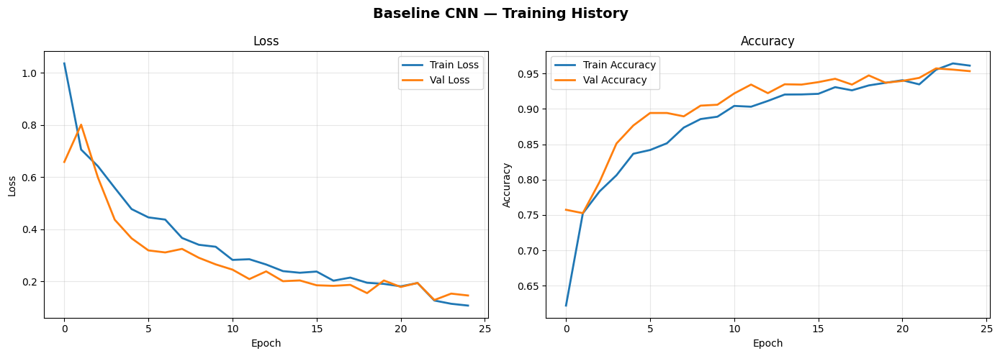

In [ ]:
def plot_history(history, title, save_path=None):
    fig, axes = plt.subplots(1,2,figsize=(14,5))
    fig.suptitle(title, fontsize=14, fontweight='bold')
    for ax,(tr,val),ylabel in zip(
        axes,
        [('loss','val_loss'),('accuracy','val_accuracy')],
        ['Loss','Accuracy']
    ):
        ax.plot(history.history[tr],  label=f'Train {ylabel}', linewidth=2)
        ax.plot(history.history[val], label=f'Val {ylabel}',   linewidth=2)
        ax.set_title(ylabel); ax.set_xlabel('Epoch'); ax.set_ylabel(ylabel)
        ax.legend(); ax.grid(True,alpha=0.3)
    plt.tight_layout()
    if save_path: plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()

def plot_cm(y_true, y_pred, class_names, title, save_path=None):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(9,7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title, fontsize=13, fontweight='bold')
    plt.ylabel('True Label'); plt.xlabel('Predicted Label')
    plt.xticks(rotation=30, ha='right'); plt.tight_layout()
    if save_path: plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()

plot_history(history_baseline,'Baseline CNN — Training History',
             os.path.join(SAVE_DIR,'../baseline_history.png'))

Baseline — Val  Acc: 95.73%  Loss: 0.1282
Baseline — Test Acc: 95.42%  Loss: 0.1894

Classification Report (Baseline — Test):
              precision    recall  f1-score   support

       daisy       0.98      0.94      0.96       176
   dandelion       0.97      0.95      0.96       150
        lily       0.95      0.98      0.96       162
      orchid       0.91      0.97      0.94       186
        rose       0.97      0.86      0.91       149
   sunflower       0.96      1.00      0.98       172
       tulip       0.95      0.98      0.96       161

    accuracy                           0.95      1156
   macro avg       0.96      0.95      0.95      1156
weighted avg       0.95      0.95      0.95      1156



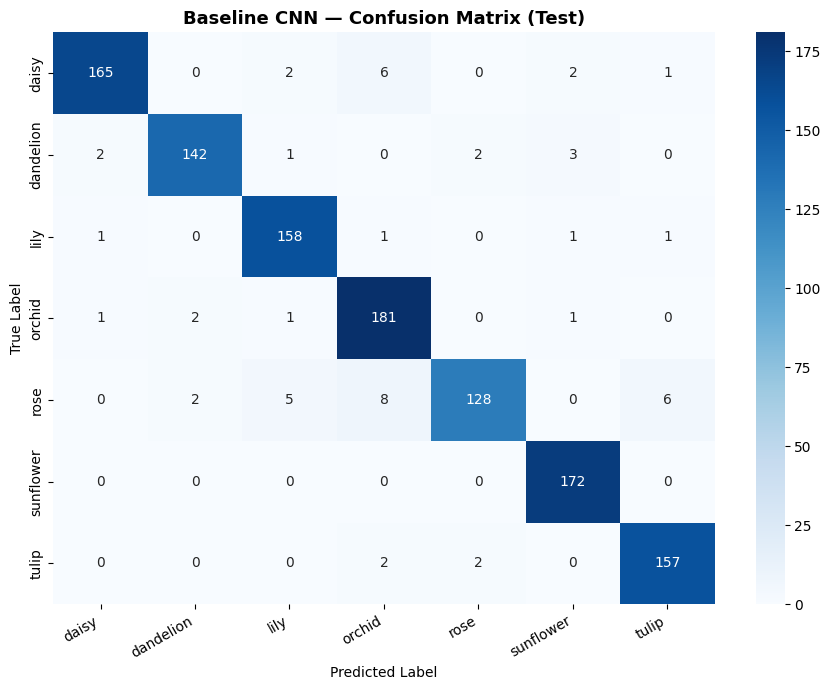

In [ ]:
baseline_best = keras.models.load_model(BASELINE_H5)

val_gen.reset()
bl_val_loss, bl_val_acc   = baseline_best.evaluate(val_gen,  verbose=0)
test_gen.reset()
bl_test_loss, bl_test_acc = baseline_best.evaluate(test_gen, verbose=0)

print(f'Baseline — Val  Acc: {bl_val_acc*100:.2f}%  Loss: {bl_val_loss:.4f}')
print(f'Baseline — Test Acc: {bl_test_acc*100:.2f}%  Loss: {bl_test_loss:.4f}')

test_gen.reset()
y_pred_base = np.argmax(baseline_best.predict(test_gen, verbose=0), axis=1)
y_true_test = test_gen.classes
print('\nClassification Report (Baseline — Test):')
print(classification_report(y_true_test, y_pred_base, target_names=CLASS_NAMES))

plot_cm(y_true_test, y_pred_base, CLASS_NAMES,
        'Baseline CNN — Confusion Matrix (Test)',
        os.path.join(SAVE_DIR,'../baseline_cm.png'))

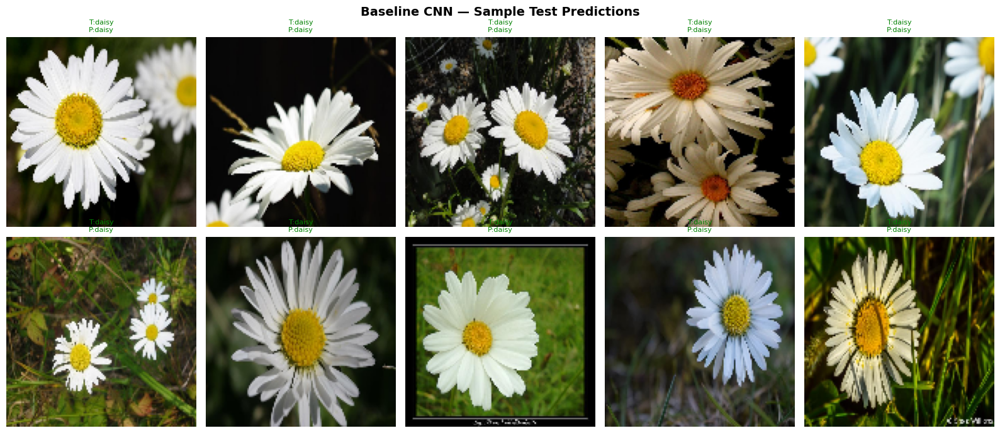

Green=Correct | Red=Incorrect


In [ ]:
test_gen.reset()
bx, by = next(test_gen)
preds = np.argmax(baseline_best.predict(bx, verbose=0), axis=1)
trues = np.argmax(by, axis=1)
fig, axes = plt.subplots(2,5,figsize=(16,7))
fig.suptitle('Baseline CNN — Sample Test Predictions', fontsize=14, fontweight='bold')
for i,ax in enumerate(axes.flat):
    ax.imshow(bx[i]); ax.axis('off')
    color = 'green' if preds[i]==trues[i] else 'red'
    ax.set_title(f'T:{CLASS_NAMES[trues[i]]}\nP:{CLASS_NAMES[preds[i]]}',color=color,fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR,'../baseline_predictions.png'),dpi=150,bbox_inches='tight')
plt.show(); print('Green=Correct | Red=Incorrect')

---
### 5. Deeper CNN with Regularisation (BatchNorm + Dropout)

In [ ]:
def build_deeper_cnn(num_classes, input_shape=(128,128,3)):
    """
    Deeper CNN — 4 double Conv-Pool blocks (8 conv layers total vs 3 in baseline)
    with BatchNormalization after every Conv and progressive Dropout.
    """
    m = models.Sequential(name='Deeper_CNN')
    # Block 1 — 32 filters ×2
    m.add(layers.Conv2D(32,(3,3),activation='relu',padding='same',input_shape=input_shape))
    m.add(layers.BatchNormalization())
    m.add(layers.Conv2D(32,(3,3),activation='relu',padding='same'))
    m.add(layers.BatchNormalization())
    m.add(layers.MaxPooling2D((2,2)))
    m.add(layers.Dropout(0.25))
    # Block 2 — 64 filters ×2
    m.add(layers.Conv2D(64,(3,3),activation='relu',padding='same'))
    m.add(layers.BatchNormalization())
    m.add(layers.Conv2D(64,(3,3),activation='relu',padding='same'))
    m.add(layers.BatchNormalization())
    m.add(layers.MaxPooling2D((2,2)))
    m.add(layers.Dropout(0.25))
    # Block 3 — 128 filters ×2
    m.add(layers.Conv2D(128,(3,3),activation='relu',padding='same'))
    m.add(layers.BatchNormalization())
    m.add(layers.Conv2D(128,(3,3),activation='relu',padding='same'))
    m.add(layers.BatchNormalization())
    m.add(layers.MaxPooling2D((2,2)))
    m.add(layers.Dropout(0.30))
    # Block 4 — 256 filters ×2  (extra depth vs baseline)
    m.add(layers.Conv2D(256,(3,3),activation='relu',padding='same'))
    m.add(layers.BatchNormalization())
    m.add(layers.Conv2D(256,(3,3),activation='relu',padding='same'))
    m.add(layers.BatchNormalization())
    m.add(layers.MaxPooling2D((2,2)))
    m.add(layers.Dropout(0.30))
    # FC head
    m.add(layers.Flatten())
    m.add(layers.Dense(1024,activation='relu'))
    m.add(layers.BatchNormalization())
    m.add(layers.Dropout(0.50))
    m.add(layers.Dense(512,activation='relu'))
    m.add(layers.Dropout(0.40))
    m.add(layers.Dense(256,activation='relu'))
    m.add(layers.Dense(num_classes,activation='softmax'))
    return m

deeper_model = build_deeper_cnn(NUM_CLASSES)
deeper_model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss='categorical_crossentropy', metrics=['accuracy']
)
deeper_model.summary()

Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 18,616,359 (71.02 MB)

 Trainable params: 18,612,391 (71.00 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
DEEPER_H5 = os.path.join(SAVE_DIR, 'deeper_cnn_adam_best.h5')

cb_deeper = [
    ModelCheckpoint(DEEPER_H5, monitor='val_accuracy',
                    save_best_only=True, save_weights_only=False, verbose=1),
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
]

start = time.time()
history_deeper_adam = deeper_model.fit(
    train_gen, epochs=35, validation_data=val_gen, callbacks=cb_deeper, verbose=1
)
deeper_adam_time = time.time() - start
print(f'\nDeeper CNN (Adam) time : {deeper_adam_time/60:.1f} min | Saved: {DEEPER_H5}')

Epoch 1/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.4383 - loss: 1.6221
Epoch 1: val_accuracy improved from None to 0.13169, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 1: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 136s 453ms/step - accuracy: 0.5436 - loss: 1.3122 - val_accuracy: 0.1317 - val_loss: 6.9315 - learning_rate: 0.0010
Epoch 2/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - accuracy: 0.6993 - loss: 0.8732
Epoch 2: val_accuracy improved from 0.13169 to 0.74136, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 2: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 105s 415ms/step - accuracy: 0.7069 - loss: 0.8511 - val_accuracy: 0.7414 - val_loss: 0.7883 - learning_rate: 0.0010
Epoch 3/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step - accuracy: 0.7480 - loss: 0.7546
Epoch 3: val_accuracy did not improve from 0.74136
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 403ms/step - accuracy: 0.7565 - loss: 0.7214 - val_accuracy: 0.6943 - val_loss: 0.9095 - learning_rate: 0.0010
Epoch 4/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - accuracy: 0.7814 - loss: 0.6317
Epoch 4: val_accuracy improved from 0.74136 to 0.76770, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 4: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 406ms/step - accuracy: 0.7813 - loss: 0.6303 - val_accuracy: 0.7677 - val_loss: 0.7859 - learning_rate: 0.0010
Epoch 5/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - accuracy: 0.8034 - loss: 0.5680
Epoch 5: val_accuracy improved from 0.76770 to 0.77245, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 5: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 106s 417ms/step - accuracy: 0.8078 - loss: 0.5583 - val_accuracy: 0.7725 - val_loss: 0.7111 - learning_rate: 0.0010
Epoch 6/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step - accuracy: 0.8272 - loss: 0.5162
Epoch 6: val_accuracy improved from 0.77245 to 0.84197, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 6: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 110s 433ms/step - accuracy: 0.8279 - loss: 0.5172 - val_accuracy: 0.8420 - val_loss: 0.4727 - learning_rate: 0.0010
Epoch 7/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step - accuracy: 0.8384 - loss: 0.4750
Epoch 7: val_accuracy did not improve from 0.84197
253/253 ━━━━━━━━━━━━━━━━━━━━ 100s 395ms/step - accuracy: 0.8425 - loss: 0.4604 - val_accuracy: 0.7949 - val_loss: 0.6931 - learning_rate: 0.0010
Epoch 8/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step - accuracy: 0.8584 - loss: 0.4288
Epoch 8: val_accuracy improved from 0.84197 to 0.86615, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 8: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 406ms/step - accuracy: 0.8499 - loss: 0.4480 - val_accuracy: 0.8661 - val_loss: 0.4543 - learning_rate: 0.0010
Epoch 9/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - accuracy: 0.8606 - loss: 0.4299
Epoch 9: val_accuracy did not improve from 0.86615
253/253 ━━━━━━━━━━━━━━━━━━━━ 106s 419ms/step - accuracy: 0.8724 - loss: 0.3958 - val_accuracy: 0.8182 - val_loss: 0.6501 - learning_rate: 0.0010
Epoch 10/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - accuracy: 0.8943 - loss: 0.3161
Epoch 10: val_accuracy did not improve from 0.86615
253/253 ━━━━━━━━━━━━━━━━━━━━ 97s 385ms/step - accuracy: 0.8899 - loss: 0.3365 - val_accuracy: 0.8549 - val_loss: 0.4054 - learning_rate: 0.0010
Epoch 11/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step - accuracy: 0.8937 - loss: 0.3227
Epoch 11: val_accuracy improved from 0.86615 to 0.88385, saving model 


Epoch 11: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 402ms/step - accuracy: 0.8932 - loss: 0.3283 - val_accuracy: 0.8839 - val_loss: 0.4937 - learning_rate: 0.0010
Epoch 12/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step - accuracy: 0.8934 - loss: 0.3299
Epoch 12: val_accuracy improved from 0.88385 to 0.89378, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 12: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 106s 419ms/step - accuracy: 0.8891 - loss: 0.3516 - val_accuracy: 0.8938 - val_loss: 0.3524 - learning_rate: 0.0010
Epoch 13/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - accuracy: 0.9025 - loss: 0.3032
Epoch 13: val_accuracy did not improve from 0.89378
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 402ms/step - accuracy: 0.9057 - loss: 0.2898 - val_accuracy: 0.2237 - val_loss: 12.2957 - learning_rate: 0.0010
Epoch 14/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.8079 - loss: 0.6203
Epoch 14: val_accuracy did not improve from 0.89378
253/253 ━━━━━━━━━━━━━━━━━━━━ 97s 381ms/step - accuracy: 0.8528 - loss: 0.4722 - val_accuracy: 0.8234 - val_loss: 0.6121 - learning_rate: 0.0010
Epoch 15/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step - accuracy: 0.8926 - loss: 0.3517
Epoch 15: val_accuracy did not improve from 0.89378
253/253 ━━━━━━


Epoch 17: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 110s 435ms/step - accuracy: 0.8904 - loss: 0.3411 - val_accuracy: 0.9378 - val_loss: 0.1959 - learning_rate: 0.0010
Epoch 18/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - accuracy: 0.9237 - loss: 0.2482
Epoch 18: val_accuracy improved from 0.93782 to 0.95553, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 18: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 108s 428ms/step - accuracy: 0.9207 - loss: 0.2582 - val_accuracy: 0.9555 - val_loss: 0.1469 - learning_rate: 0.0010
Epoch 19/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - accuracy: 0.9224 - loss: 0.2500
Epoch 19: val_accuracy did not improve from 0.95553
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 406ms/step - accuracy: 0.9198 - loss: 0.2626 - val_accuracy: 0.9383 - val_loss: 0.1891 - learning_rate: 0.0010
Epoch 20/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step - accuracy: 0.9337 - loss: 0.2064
Epoch 20: val_accuracy improved from 0.95553 to 0.96718, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 20: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 104s 412ms/step - accuracy: 0.9317 - loss: 0.2089 - val_accuracy: 0.9672 - val_loss: 0.1074 - learning_rate: 0.0010
Epoch 21/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - accuracy: 0.9366 - loss: 0.1957
Epoch 21: val_accuracy did not improve from 0.96718
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 404ms/step - accuracy: 0.9289 - loss: 0.2218 - val_accuracy: 0.9063 - val_loss: 0.3093 - learning_rate: 0.0010
Epoch 22/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - accuracy: 0.9357 - loss: 0.2157
Epoch 22: val_accuracy did not improve from 0.96718
253/253 ━━━━━━━━━━━━━━━━━━━━ 106s 420ms/step - accuracy: 0.9348 - loss: 0.2124 - val_accuracy: 0.9357 - val_loss: 0.2031 - learning_rate: 0.0010
Epoch 23/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step - accuracy: 0.9475 - loss: 0.1667
Epoch 23: val_accuracy did not improve from 0.96718
253/253 ━━━━━━


Epoch 28: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 108s 427ms/step - accuracy: 0.9627 - loss: 0.1172 - val_accuracy: 0.9793 - val_loss: 0.0641 - learning_rate: 5.0000e-04
Epoch 29/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step - accuracy: 0.9673 - loss: 0.1072
Epoch 29: val_accuracy improved from 0.97927 to 0.98014, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5



Epoch 29: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_adam_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 111s 439ms/step - accuracy: 0.9647 - loss: 0.1104 - val_accuracy: 0.9801 - val_loss: 0.0707 - learning_rate: 5.0000e-04
Epoch 30/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step - accuracy: 0.9660 - loss: 0.1033
Epoch 30: val_accuracy did not improve from 0.98014
253/253 ━━━━━━━━━━━━━━━━━━━━ 104s 408ms/step - accuracy: 0.9669 - loss: 0.1061 - val_accuracy: 0.9775 - val_loss: 0.0698 - learning_rate: 5.0000e-04
Epoch 31/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - accuracy: 0.9683 - loss: 0.1003
Epoch 31: val_accuracy did not improve from 0.98014

Epoch 31: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
253/253 ━━━━━━━━━━━━━━━━━━━━ 97s 382ms/step - accuracy: 0.9680 - loss: 0.1018 - val_accuracy: 0.9663 - val_loss: 0.1110 - learning_rate: 5.0000e-04
Epoch 32/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step - accuracy:

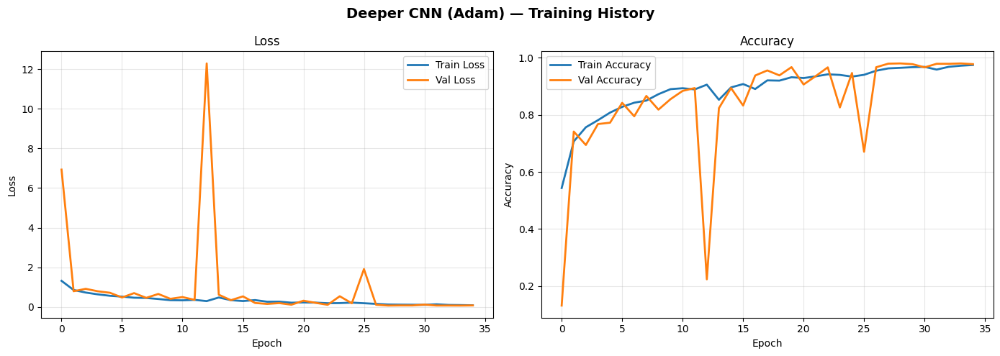

Deeper CNN (Adam) — Val  Acc: 98.01%  Loss: 0.0707
Deeper CNN (Adam) — Test Acc: 97.15%  Loss: 0.0923

Classification Report (Deeper CNN — Test):
              precision    recall  f1-score   support

       daisy       1.00      0.95      0.98       176
   dandelion       0.98      0.97      0.98       150
        lily       0.96      0.99      0.98       162
      orchid       0.96      0.97      0.97       186
        rose       0.95      0.96      0.96       149
   sunflower       0.97      0.99      0.98       172
       tulip       0.97      0.96      0.97       161

    accuracy                           0.97      1156
   macro avg       0.97      0.97      0.97      1156
weighted avg       0.97      0.97      0.97      1156



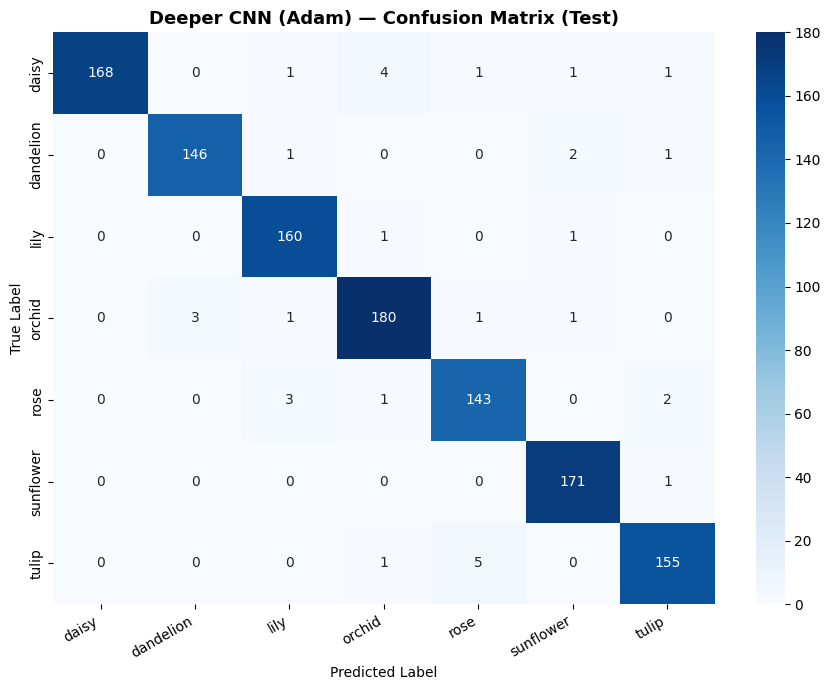

In [ ]:
plot_history(history_deeper_adam,'Deeper CNN (Adam) — Training History',
             os.path.join(SAVE_DIR,'../deeper_adam_history.png'))

deeper_best = keras.models.load_model(DEEPER_H5)
val_gen.reset();  dp_val_loss, dp_val_acc   = deeper_best.evaluate(val_gen,  verbose=0)
test_gen.reset(); dp_test_loss, dp_test_acc = deeper_best.evaluate(test_gen, verbose=0)
print(f'Deeper CNN (Adam) — Val  Acc: {dp_val_acc*100:.2f}%  Loss: {dp_val_loss:.4f}')
print(f'Deeper CNN (Adam) — Test Acc: {dp_test_acc*100:.2f}%  Loss: {dp_test_loss:.4f}')

test_gen.reset()
y_pred_deeper = np.argmax(deeper_best.predict(test_gen, verbose=0), axis=1)
print('\nClassification Report (Deeper CNN — Test):')
print(classification_report(y_true_test, y_pred_deeper, target_names=CLASS_NAMES))
plot_cm(y_true_test, y_pred_deeper, CLASS_NAMES,
        'Deeper CNN (Adam) — Confusion Matrix (Test)',
        os.path.join(SAVE_DIR,'../deeper_adam_cm.png'))

---
### 6. Experimentation & Comparative Analysis
#### 6a. Optimizer Comparison — SGD vs Adam

In [ ]:
SGD_H5 = os.path.join(SAVE_DIR, 'deeper_cnn_sgd_best.h5')

deeper_sgd = build_deeper_cnn(NUM_CLASSES)
deeper_sgd.compile(
    optimizer=keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss='categorical_crossentropy', metrics=['accuracy']
)
cb_sgd = [
    ModelCheckpoint(SGD_H5, monitor='val_accuracy',
                    save_best_only=True, save_weights_only=False, verbose=1),
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
]
start = time.time()
history_deeper_sgd = deeper_sgd.fit(
    train_gen, epochs=35, validation_data=val_gen, callbacks=cb_sgd, verbose=1
)
deeper_sgd_time = time.time() - start
print(f'Deeper CNN (SGD) time : {deeper_sgd_time/60:.1f} min | Saved: {SGD_H5}')

Epoch 1/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - accuracy: 0.4114 - loss: 1.6922
Epoch 1: val_accuracy improved from None to 0.69430, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 1: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 122s 432ms/step - accuracy: 0.5134 - loss: 1.3562 - val_accuracy: 0.6943 - val_loss: 0.9146 - learning_rate: 0.0100
Epoch 2/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step - accuracy: 0.6421 - loss: 1.0179
Epoch 2: val_accuracy improved from 0.69430 to 0.73014, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 2: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 98s 388ms/step - accuracy: 0.6469 - loss: 0.9930 - val_accuracy: 0.7301 - val_loss: 0.8079 - learning_rate: 0.0100
Epoch 3/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step - accuracy: 0.6794 - loss: 0.9278
Epoch 3: val_accuracy improved from 0.73014 to 0.76339, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 3: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 402ms/step - accuracy: 0.6882 - loss: 0.9089 - val_accuracy: 0.7634 - val_loss: 0.6917 - learning_rate: 0.0100
Epoch 4/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step - accuracy: 0.6938 - loss: 0.8783
Epoch 4: val_accuracy improved from 0.76339 to 0.77418, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 4: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 403ms/step - accuracy: 0.6975 - loss: 0.8728 - val_accuracy: 0.7742 - val_loss: 0.6641 - learning_rate: 0.0100
Epoch 5/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - accuracy: 0.7139 - loss: 0.8253
Epoch 5: val_accuracy improved from 0.77418 to 0.79231, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 5: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 100s 396ms/step - accuracy: 0.7233 - loss: 0.8096 - val_accuracy: 0.7923 - val_loss: 0.6031 - learning_rate: 0.0100
Epoch 6/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step - accuracy: 0.7397 - loss: 0.7677
Epoch 6: val_accuracy improved from 0.79231 to 0.81952, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 6: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 401ms/step - accuracy: 0.7495 - loss: 0.7347 - val_accuracy: 0.8195 - val_loss: 0.5247 - learning_rate: 0.0100
Epoch 7/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - accuracy: 0.7539 - loss: 0.7135
Epoch 7: val_accuracy improved from 0.81952 to 0.83549, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 7: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 105s 416ms/step - accuracy: 0.7583 - loss: 0.7150 - val_accuracy: 0.8355 - val_loss: 0.4769 - learning_rate: 0.0100
Epoch 8/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - accuracy: 0.7687 - loss: 0.6922
Epoch 8: val_accuracy improved from 0.83549 to 0.83808, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 8: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 108s 425ms/step - accuracy: 0.7725 - loss: 0.6863 - val_accuracy: 0.8381 - val_loss: 0.5006 - learning_rate: 0.0100
Epoch 9/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step - accuracy: 0.7726 - loss: 0.6822
Epoch 9: val_accuracy did not improve from 0.83808
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 397ms/step - accuracy: 0.7721 - loss: 0.6804 - val_accuracy: 0.8230 - val_loss: 0.5443 - learning_rate: 0.0100
Epoch 10/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step - accuracy: 0.7815 - loss: 0.6535
Epoch 10: val_accuracy did not improve from 0.83808

Epoch 10: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
253/253 ━━━━━━━━━━━━━━━━━━━━ 99s 392ms/step - accuracy: 0.7844 - loss: 0.6504 - val_accuracy: 0.8325 - val_loss: 0.5033 - learning_rate: 0.0100
Epoch 11/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step - accuracy: 0.8140 - loss: 0


Epoch 11: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 401ms/step - accuracy: 0.8103 - loss: 0.5706 - val_accuracy: 0.8476 - val_loss: 0.4456 - learning_rate: 0.0050
Epoch 12/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - accuracy: 0.8186 - loss: 0.5401
Epoch 12: val_accuracy improved from 0.84758 to 0.86960, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 12: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 105s 413ms/step - accuracy: 0.8191 - loss: 0.5407 - val_accuracy: 0.8696 - val_loss: 0.4034 - learning_rate: 0.0050
Epoch 13/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - accuracy: 0.8297 - loss: 0.5099
Epoch 13: val_accuracy did not improve from 0.86960
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 404ms/step - accuracy: 0.8219 - loss: 0.5330 - val_accuracy: 0.8351 - val_loss: 0.4742 - learning_rate: 0.0050
Epoch 14/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step - accuracy: 0.8246 - loss: 0.5189
Epoch 14: val_accuracy did not improve from 0.86960
253/253 ━━━━━━━━━━━━━━━━━━━━ 97s 385ms/step - accuracy: 0.8238 - loss: 0.5310 - val_accuracy: 0.7919 - val_loss: 0.6267 - learning_rate: 0.0050
Epoch 15/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - accuracy: 0.8111 - loss: 0.5672
Epoch 15: val_accuracy improved from 0.86960 to 0.88601, saving mode


Epoch 15: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 100s 396ms/step - accuracy: 0.8215 - loss: 0.5300 - val_accuracy: 0.8860 - val_loss: 0.3627 - learning_rate: 0.0050
Epoch 16/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - accuracy: 0.8359 - loss: 0.5070
Epoch 16: val_accuracy did not improve from 0.88601
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 401ms/step - accuracy: 0.8368 - loss: 0.5004 - val_accuracy: 0.8709 - val_loss: 0.3699 - learning_rate: 0.0050
Epoch 17/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.8429 - loss: 0.4799
Epoch 17: val_accuracy did not improve from 0.88601
253/253 ━━━━━━━━━━━━━━━━━━━━ 105s 414ms/step - accuracy: 0.8451 - loss: 0.4754 - val_accuracy: 0.8674 - val_loss: 0.3836 - learning_rate: 0.0050
Epoch 18/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step - accuracy: 0.8468 - loss: 0.4707
Epoch 18: val_accuracy improved from 0.88601 to 0.90026, saving mod


Epoch 18: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 100s 396ms/step - accuracy: 0.8515 - loss: 0.4532 - val_accuracy: 0.9003 - val_loss: 0.3113 - learning_rate: 0.0050
Epoch 19/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step - accuracy: 0.8491 - loss: 0.4392
Epoch 19: val_accuracy improved from 0.90026 to 0.90587, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 19: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 403ms/step - accuracy: 0.8464 - loss: 0.4491 - val_accuracy: 0.9059 - val_loss: 0.2932 - learning_rate: 0.0050
Epoch 20/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - accuracy: 0.8552 - loss: 0.4223
Epoch 20: val_accuracy did not improve from 0.90587
253/253 ━━━━━━━━━━━━━━━━━━━━ 102s 401ms/step - accuracy: 0.8586 - loss: 0.4268 - val_accuracy: 0.8955 - val_loss: 0.3126 - learning_rate: 0.0050
Epoch 21/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - accuracy: 0.8614 - loss: 0.4179
Epoch 21: val_accuracy did not improve from 0.90587
253/253 ━━━━━━━━━━━━━━━━━━━━ 97s 383ms/step - accuracy: 0.8574 - loss: 0.4318 - val_accuracy: 0.8895 - val_loss: 0.3390 - learning_rate: 0.0050
Epoch 22/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - accuracy: 0.8647 - loss: 0.4128
Epoch 22: val_accuracy did not improve from 0.90587

Epoch 22: Reduc


Epoch 23: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 100s 396ms/step - accuracy: 0.8794 - loss: 0.3703 - val_accuracy: 0.9154 - val_loss: 0.2638 - learning_rate: 0.0025
Epoch 24/35
252/253 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step - accuracy: 0.8875 - loss: 0.3435
Epoch 24: val_accuracy did not improve from 0.91537
253/253 ━━━━━━━━━━━━━━━━━━━━ 107s 400ms/step - accuracy: 0.8823 - loss: 0.3526 - val_accuracy: 0.9149 - val_loss: 0.2509 - learning_rate: 0.0025
Epoch 25/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step - accuracy: 0.8789 - loss: 0.3533
Epoch 25: val_accuracy improved from 0.91537 to 0.91623, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 25: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 98s 386ms/step - accuracy: 0.8795 - loss: 0.3532 - val_accuracy: 0.9162 - val_loss: 0.2433 - learning_rate: 0.0025
Epoch 26/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step - accuracy: 0.8926 - loss: 0.3202
Epoch 26: val_accuracy improved from 0.91623 to 0.92142, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 26: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 406ms/step - accuracy: 0.8891 - loss: 0.3338 - val_accuracy: 0.9214 - val_loss: 0.2326 - learning_rate: 0.0025
Epoch 27/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step - accuracy: 0.8913 - loss: 0.3420
Epoch 27: val_accuracy improved from 0.92142 to 0.92314, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 27: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 100s 395ms/step - accuracy: 0.8911 - loss: 0.3396 - val_accuracy: 0.9231 - val_loss: 0.2244 - learning_rate: 0.0025
Epoch 28/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - accuracy: 0.8964 - loss: 0.3175
Epoch 28: val_accuracy improved from 0.92314 to 0.92487, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 28: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 109s 431ms/step - accuracy: 0.8911 - loss: 0.3251 - val_accuracy: 0.9249 - val_loss: 0.2296 - learning_rate: 0.0025
Epoch 29/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - accuracy: 0.8915 - loss: 0.3251
Epoch 29: val_accuracy did not improve from 0.92487
253/253 ━━━━━━━━━━━━━━━━━━━━ 97s 381ms/step - accuracy: 0.8958 - loss: 0.3119 - val_accuracy: 0.9188 - val_loss: 0.2465 - learning_rate: 0.0025
Epoch 30/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - accuracy: 0.8978 - loss: 0.2995
Epoch 30: val_accuracy improved from 0.92487 to 0.93221, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5



Epoch 30: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 99s 391ms/step - accuracy: 0.8996 - loss: 0.3015 - val_accuracy: 0.9322 - val_loss: 0.2161 - learning_rate: 0.0025
Epoch 31/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step - accuracy: 0.8977 - loss: 0.3020
Epoch 31: val_accuracy did not improve from 0.93221
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 400ms/step - accuracy: 0.8980 - loss: 0.2947 - val_accuracy: 0.9318 - val_loss: 0.2100 - learning_rate: 0.0025
Epoch 32/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step - accuracy: 0.9017 - loss: 0.2901
Epoch 32: val_accuracy did not improve from 0.93221
253/253 ━━━━━━━━━━━━━━━━━━━━ 95s 374ms/step - accuracy: 0.8971 - loss: 0.3064 - val_accuracy: 0.9184 - val_loss: 0.2499 - learning_rate: 0.0025
Epoch 33/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step - accuracy: 0.8949 - loss: 0.3153
Epoch 33: val_accuracy improved from 0.93221 to 0.93739, saving model


Epoch 33: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/deeper_cnn_sgd_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 96s 380ms/step - accuracy: 0.9017 - loss: 0.3033 - val_accuracy: 0.9374 - val_loss: 0.1981 - learning_rate: 0.0025
Epoch 34/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step - accuracy: 0.9032 - loss: 0.2863
Epoch 34: val_accuracy did not improve from 0.93739
253/253 ━━━━━━━━━━━━━━━━━━━━ 99s 391ms/step - accuracy: 0.9067 - loss: 0.2839 - val_accuracy: 0.9301 - val_loss: 0.2207 - learning_rate: 0.0025
Epoch 35/35
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step - accuracy: 0.8965 - loss: 0.3184
Epoch 35: val_accuracy did not improve from 0.93739
253/253 ━━━━━━━━━━━━━━━━━━━━ 94s 372ms/step - accuracy: 0.9025 - loss: 0.2950 - val_accuracy: 0.9357 - val_loss: 0.1937 - learning_rate: 0.0025
Restoring model weights from the end of the best epoch: 35.
Deeper CNN (SGD) time : 59.2 min | Saved: /content/drive/MyDrive/AI ML /part2FlowerClassification/s

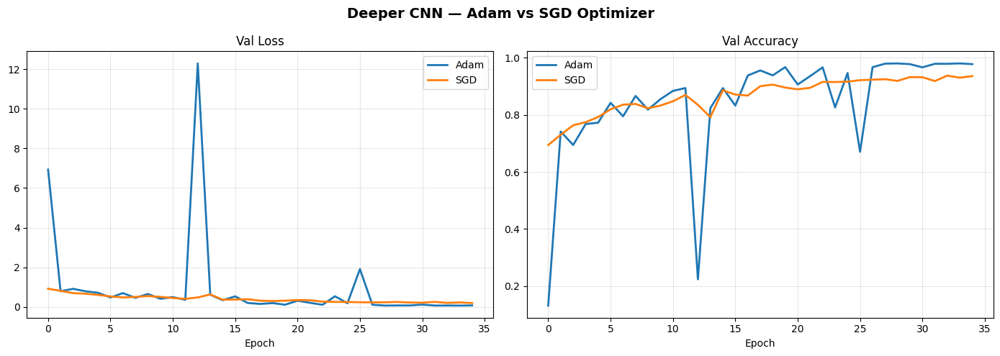

Adam Test Acc: 97.15%  |  SGD Test Acc: 92.21%


In [ ]:
fig, axes = plt.subplots(1,2,figsize=(14,5))
fig.suptitle('Deeper CNN — Adam vs SGD Optimizer', fontsize=14, fontweight='bold')
axes[0].plot(history_deeper_adam.history['val_loss'], label='Adam', linewidth=2)
axes[0].plot(history_deeper_sgd.history['val_loss'],  label='SGD',  linewidth=2)
axes[0].set_title('Val Loss'); axes[0].set_xlabel('Epoch')
axes[0].legend(); axes[0].grid(True,alpha=0.3)
axes[1].plot(history_deeper_adam.history['val_accuracy'], label='Adam', linewidth=2)
axes[1].plot(history_deeper_sgd.history['val_accuracy'],  label='SGD',  linewidth=2)
axes[1].set_title('Val Accuracy'); axes[1].set_xlabel('Epoch')
axes[1].legend(); axes[1].grid(True,alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR,'../optimizer_comparison.png'),dpi=150,bbox_inches='tight')
plt.show()

sgd_best = keras.models.load_model(SGD_H5)
test_gen.reset(); _, sgd_test_acc = sgd_best.evaluate(test_gen, verbose=0)
print(f'Adam Test Acc: {dp_test_acc*100:.2f}%  |  SGD Test Acc: {sgd_test_acc*100:.2f}%')

#### 6b. Ablation Study — Remove Dropout

In [ ]:
def build_no_dropout(num_classes, input_shape=(128,128,3)):
    """Identical to deeper_cnn but WITHOUT any Dropout layers."""
    m = models.Sequential(name='Deeper_No_Dropout')
    for pf in [32,64,128,256]:
        kw = {'input_shape':input_shape} if pf==32 else {}
        m.add(layers.Conv2D(pf,(3,3),activation='relu',padding='same',**kw))
        m.add(layers.BatchNormalization())
        m.add(layers.Conv2D(pf,(3,3),activation='relu',padding='same'))
        m.add(layers.BatchNormalization())
        m.add(layers.MaxPooling2D((2,2)))
        # NO Dropout
    m.add(layers.Flatten())
    m.add(layers.Dense(1024,activation='relu'))
    m.add(layers.BatchNormalization())
    m.add(layers.Dense(512,activation='relu'))
    m.add(layers.Dense(256,activation='relu'))
    m.add(layers.Dense(num_classes,activation='softmax'))
    return m

ABLATION_H5 = os.path.join(SAVE_DIR, 'ablation_no_dropout_best.h5')
abl_model = build_no_dropout(NUM_CLASSES)
abl_model.compile(optimizer=keras.optimizers.Adam(1e-3),
                  loss='categorical_crossentropy', metrics=['accuracy'])
cb_abl = [
    ModelCheckpoint(ABLATION_H5, monitor='val_accuracy',
                    save_best_only=True, save_weights_only=False, verbose=1),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1)
]
start = time.time()
history_ablation = abl_model.fit(
    train_gen, epochs=25, validation_data=val_gen, callbacks=cb_abl, verbose=1
)
abl_time = time.time()-start

abl_best = keras.models.load_model(ABLATION_H5)
test_gen.reset(); _, abl_test_acc = abl_best.evaluate(test_gen, verbose=0)
print(f'\nAblation (No Dropout) Test Acc : {abl_test_acc*100:.2f}%')
print(f'Deeper + Dropout      Test Acc : {dp_test_acc*100:.2f}%')
print('→ Dropout reduces overfitting and improves generalisation.')

Epoch 1/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step - accuracy: 0.5655 - loss: 1.2657
Epoch 1: val_accuracy improved from None to 0.18869, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5



Epoch 1: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 115s 404ms/step - accuracy: 0.6540 - loss: 1.0176 - val_accuracy: 0.1887 - val_loss: 4.2478
Epoch 2/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - accuracy: 0.7580 - loss: 0.7093
Epoch 2: val_accuracy improved from 0.18869 to 0.79706, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5



Epoch 2: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 406ms/step - accuracy: 0.7637 - loss: 0.6971 - val_accuracy: 0.7971 - val_loss: 0.5811
Epoch 3/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step - accuracy: 0.8050 - loss: 0.5892
Epoch 3: val_accuracy did not improve from 0.79706
253/253 ━━━━━━━━━━━━━━━━━━━━ 100s 396ms/step - accuracy: 0.8088 - loss: 0.5670 - val_accuracy: 0.7509 - val_loss: 0.7768
Epoch 4/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step - accuracy: 0.8349 - loss: 0.5005
Epoch 4: val_accuracy improved from 0.79706 to 0.86658, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5



Epoch 4: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 111s 441ms/step - accuracy: 0.8383 - loss: 0.4929 - val_accuracy: 0.8666 - val_loss: 0.4171
Epoch 5/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step - accuracy: 0.8604 - loss: 0.4248
Epoch 5: val_accuracy did not improve from 0.86658
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 398ms/step - accuracy: 0.8601 - loss: 0.4241 - val_accuracy: 0.8169 - val_loss: 0.5300
Epoch 6/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step - accuracy: 0.8647 - loss: 0.4126
Epoch 6: val_accuracy improved from 0.86658 to 0.88601, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5



Epoch 6: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 98s 387ms/step - accuracy: 0.8724 - loss: 0.3879 - val_accuracy: 0.8860 - val_loss: 0.3226
Epoch 7/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step - accuracy: 0.8874 - loss: 0.3571
Epoch 7: val_accuracy improved from 0.88601 to 0.90501, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5



Epoch 7: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 104s 410ms/step - accuracy: 0.8940 - loss: 0.3324 - val_accuracy: 0.9050 - val_loss: 0.2992
Epoch 8/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step - accuracy: 0.8939 - loss: 0.3277
Epoch 8: val_accuracy did not improve from 0.90501
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 399ms/step - accuracy: 0.8836 - loss: 0.3557 - val_accuracy: 0.8381 - val_loss: 0.6004
Epoch 9/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.9093 - loss: 0.2920
Epoch 9: val_accuracy improved from 0.90501 to 0.92789, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5



Epoch 9: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 99s 393ms/step - accuracy: 0.9094 - loss: 0.2867 - val_accuracy: 0.9279 - val_loss: 0.2269
Epoch 10/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step - accuracy: 0.9207 - loss: 0.2552
Epoch 10: val_accuracy did not improve from 0.92789
253/253 ━━━━━━━━━━━━━━━━━━━━ 101s 398ms/step - accuracy: 0.9213 - loss: 0.2574 - val_accuracy: 0.7915 - val_loss: 0.7627
Epoch 11/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.9154 - loss: 0.2539
Epoch 11: val_accuracy improved from 0.92789 to 0.94603, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5



Epoch 11: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 99s 393ms/step - accuracy: 0.9204 - loss: 0.2454 - val_accuracy: 0.9460 - val_loss: 0.1696
Epoch 12/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step - accuracy: 0.9275 - loss: 0.2264
Epoch 12: val_accuracy did not improve from 0.94603
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 407ms/step - accuracy: 0.9270 - loss: 0.2268 - val_accuracy: 0.9426 - val_loss: 0.1742
Epoch 13/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step - accuracy: 0.9251 - loss: 0.2314
Epoch 13: val_accuracy did not improve from 0.94603
253/253 ━━━━━━━━━━━━━━━━━━━━ 97s 384ms/step - accuracy: 0.9201 - loss: 0.2526 - val_accuracy: 0.9003 - val_loss: 0.3285
Epoch 14/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.9336 - loss: 0.2102
Epoch 14: val_accuracy did not improve from 0.94603
253/253 ━━━━━━━━━━━━━━━━━━━━ 96s 379ms/step - accuracy: 0.9233 - loss: 0.2356 - val_


Epoch 15: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 99s 392ms/step - accuracy: 0.9368 - loss: 0.1948 - val_accuracy: 0.9577 - val_loss: 0.1351
Epoch 16/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step - accuracy: 0.9416 - loss: 0.1725
Epoch 16: val_accuracy did not improve from 0.95769
253/253 ━━━━━━━━━━━━━━━━━━━━ 104s 409ms/step - accuracy: 0.9414 - loss: 0.1744 - val_accuracy: 0.9313 - val_loss: 0.2220
Epoch 17/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - accuracy: 0.9513 - loss: 0.1497
Epoch 17: val_accuracy improved from 0.95769 to 0.96114, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5



Epoch 17: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/ablation_no_dropout_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 106s 420ms/step - accuracy: 0.9530 - loss: 0.1471 - val_accuracy: 0.9611 - val_loss: 0.1360
Epoch 18/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step - accuracy: 0.9561 - loss: 0.1345
Epoch 18: val_accuracy did not improve from 0.96114
253/253 ━━━━━━━━━━━━━━━━━━━━ 103s 407ms/step - accuracy: 0.9528 - loss: 0.1421 - val_accuracy: 0.9335 - val_loss: 0.2351
Epoch 19/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - accuracy: 0.9478 - loss: 0.1564
Epoch 19: val_accuracy did not improve from 0.96114
253/253 ━━━━━━━━━━━━━━━━━━━━ 98s 387ms/step - accuracy: 0.9488 - loss: 0.1606 - val_accuracy: 0.9348 - val_loss: 0.1902
Epoch 20/25
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step - accuracy: 0.9424 - loss: 0.1772
Epoch 20: val_accuracy did not improve from 0.96114
253/253 ━━━━━━━━━━━━━━━━━━━━ 95s 377ms/step - accuracy: 0.9396 - loss: 0.1853 - val


Ablation (No Dropout) Test Acc : 95.16%
Deeper + Dropout      Test Acc : 97.15%
→ Dropout reduces overfitting and improves generalisation.


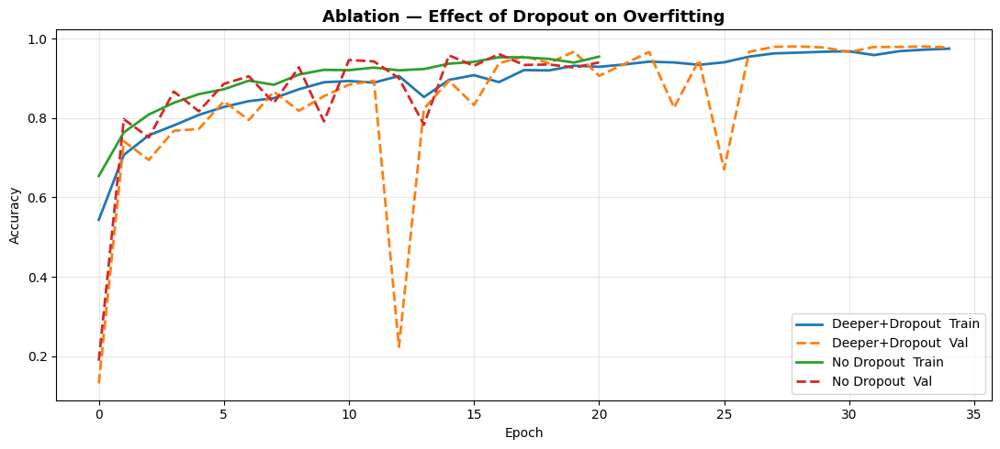

In [ ]:
fig, ax = plt.subplots(figsize=(11,5))
ax.plot(history_deeper_adam.history['accuracy'],     label='Deeper+Dropout  Train', linewidth=2)
ax.plot(history_deeper_adam.history['val_accuracy'], label='Deeper+Dropout  Val',   linewidth=2, linestyle='--')
ax.plot(history_ablation.history['accuracy'],        label='No Dropout  Train',     linewidth=2)
ax.plot(history_ablation.history['val_accuracy'],    label='No Dropout  Val',       linewidth=2, linestyle='--')
ax.set_title('Ablation — Effect of Dropout on Overfitting', fontsize=13, fontweight='bold')
ax.set_xlabel('Epoch'); ax.set_ylabel('Accuracy'); ax.legend(); ax.grid(True,alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR,'../ablation_dropout.png'),dpi=150,bbox_inches='tight')
plt.show()

---
## Part B — Transfer Learning (MobileNetV2)
### 7. Fine-Tuning a Pre-Trained Model

In [ ]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

DATASET_ROOT = '/content/drive/MyDrive/AI ML/part2FlowerClassification/flowers'
TRAIN_DIR = os.path.join(DATASET_ROOT, 'train')
VAL_DIR   = os.path.join(DATASET_ROOT, 'val')
TEST_DIR  = os.path.join(DATASET_ROOT, 'test')

TL_SIZE = (224, 224)
BATCH_SIZE = 32 # Defined in `generators` cell
SEED = 42       # Defined in `generators` cell

tl_train_dg = ImageDataGenerator(
    rescale=1./255, rotation_range=30,
    width_shift_range=0.2, height_shift_range=0.2,
    zoom_range=0.2, horizontal_flip=True, fill_mode='nearest'
)
tl_test_dg = ImageDataGenerator(rescale=1./255)

tl_train_gen = tl_train_dg.flow_from_directory(
    TRAIN_DIR, target_size=TL_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', seed=SEED, shuffle=True
)
tl_val_gen  = tl_test_dg.flow_from_directory(
    VAL_DIR,  target_size=TL_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', seed=SEED, shuffle=False
)
tl_test_gen = tl_test_dg.flow_from_directory(
    TEST_DIR, target_size=TL_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', seed=SEED, shuffle=False
)
print(f'TL Train={tl_train_gen.n} | Val={tl_val_gen.n} | Test={tl_test_gen.n}')

Found 8070 images belonging to 7 classes.
Found 2306 images belonging to 7 classes.
Found 1156 images belonging to 7 classes.
TL Train=8070 | Val=2306 | Test=1156


In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow import keras
from tensorflow.keras import layers

# Load MobileNetV2 without top classification layer
base_model = MobileNetV2(input_shape=(224,224,3), include_top=False, weights='imagenet')
base_model.trainable = False     # Phase 1: freeze entire base
print(f'MobileNetV2 loaded — {len(base_model.layers)} layers (frozen)')

NUM_CLASSES = 7

# Custom head for 7-class flower classification
inp   = keras.Input(shape=(224,224,3))
x     = base_model(inp, training=False)
x     = layers.GlobalAveragePooling2D()(x)
x     = layers.BatchNormalization()(x)
x     = layers.Dense(256, activation='relu')(x)
x     = layers.Dropout(0.4)(x)
out   = layers.Dense(NUM_CLASSES, activation='softmax')(x)

tl_model = keras.Model(inp, out, name='MobileNetV2_FlowerClassifier')
tl_model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
MobileNetV2 loaded — 154 layers (frozen)


Model: "MobileNetV2_FlowerClassifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,592,839 (9.89 MB)

 Trainable params: 332,295 (1.27 MB)

 Non-trainable params: 2,260,544 (8.62 MB)

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import time

TL_P1_H5 = os.path.join(SAVE_DIR, 'mobilenetv2_phase1_best.h5')

tl_model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss='categorical_crossentropy', metrics=['accuracy']
)
cb_tl1 = [
    ModelCheckpoint(TL_P1_H5, monitor='val_accuracy',
                    save_best_only=True, save_weights_only=False, verbose=1),
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
]
print('Phase 1 — Feature Extraction (frozen base)')
start = time.time()
history_tl_p1 = tl_model.fit(
    tl_train_gen, epochs=15, validation_data=tl_val_gen, callbacks=cb_tl1, verbose=1
)
tl_p1_time = time.time()-start
print(f'Phase 1 : {tl_p1_time/60:.1f} min | Saved: {TL_P1_H5}')

Phase 1 — Feature Extraction (frozen base)
Epoch 1/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.8552 - loss: 0.4499 
Epoch 1: val_accuracy improved from None to 0.97398, saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5



Epoch 1: finished saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 6057s 24s/step - accuracy: 0.9203 - loss: 0.2548 - val_accuracy: 0.9740 - val_loss: 0.0822 - learning_rate: 0.0010
Epoch 2/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 545ms/step - accuracy: 0.9627 - loss: 0.1193
Epoch 2: val_accuracy improved from 0.97398 to 0.98265, saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5



Epoch 2: finished saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 153s 603ms/step - accuracy: 0.9590 - loss: 0.1309 - val_accuracy: 0.9827 - val_loss: 0.0650 - learning_rate: 0.0010
Epoch 3/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.9669 - loss: 0.0997
Epoch 3: val_accuracy improved from 0.98265 to 0.99089, saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5



Epoch 3: finished saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 150s 594ms/step - accuracy: 0.9659 - loss: 0.1074 - val_accuracy: 0.9909 - val_loss: 0.0452 - learning_rate: 0.0010
Epoch 4/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.9723 - loss: 0.0865
Epoch 4: val_accuracy did not improve from 0.99089
253/253 ━━━━━━━━━━━━━━━━━━━━ 145s 575ms/step - accuracy: 0.9695 - loss: 0.0960 - val_accuracy: 0.9896 - val_loss: 0.0443 - learning_rate: 0.0010
Epoch 5/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.9787 - loss: 0.0718
Epoch 5: val_accuracy did not improve from 0.99089
253/253 ━━━━━━━━━━━━━━━━━━━━ 155s 614ms/step - accuracy: 0.9756 - loss: 0.0775 - val_accuracy: 0.9870 - val_loss: 0.0434 - learning_rate: 0.0010
Epoch 6/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.9761 - loss: 0.0713
Epoch 6: val_accuracy did not improve from 0.99089
253/253 ━━━━━━━━━━━


Epoch 9: finished saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 147s 580ms/step - accuracy: 0.9786 - loss: 0.0664 - val_accuracy: 0.9913 - val_loss: 0.0446 - learning_rate: 5.0000e-04
Epoch 10/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 543ms/step - accuracy: 0.9873 - loss: 0.0443
Epoch 10: val_accuracy improved from 0.99133 to 0.99219, saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5



Epoch 10: finished saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 214s 629ms/step - accuracy: 0.9849 - loss: 0.0484 - val_accuracy: 0.9922 - val_loss: 0.0384 - learning_rate: 5.0000e-04
Epoch 11/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 532ms/step - accuracy: 0.9845 - loss: 0.0416
Epoch 11: val_accuracy did not improve from 0.99219
253/253 ━━━━━━━━━━━━━━━━━━━━ 147s 581ms/step - accuracy: 0.9862 - loss: 0.0400 - val_accuracy: 0.9918 - val_loss: 0.0401 - learning_rate: 5.0000e-04
Epoch 12/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.9861 - loss: 0.0405
Epoch 12: val_accuracy did not improve from 0.99219
253/253 ━━━━━━━━━━━━━━━━━━━━ 145s 573ms/step - accuracy: 0.9860 - loss: 0.0415 - val_accuracy: 0.9896 - val_loss: 0.0437 - learning_rate: 5.0000e-04
Epoch 13/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 521ms/step - accuracy: 0.9848 - loss: 0.0475
Epoch 13: val_accuracy did not improve from 0.99219



Epoch 14: finished saving model to /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 158s 625ms/step - accuracy: 0.9884 - loss: 0.0383 - val_accuracy: 0.9926 - val_loss: 0.0365 - learning_rate: 5.0000e-04
Epoch 15/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 522ms/step - accuracy: 0.9853 - loss: 0.0455
Epoch 15: val_accuracy did not improve from 0.99263
253/253 ━━━━━━━━━━━━━━━━━━━━ 145s 572ms/step - accuracy: 0.9862 - loss: 0.0426 - val_accuracy: 0.9922 - val_loss: 0.0361 - learning_rate: 5.0000e-04
Restoring model weights from the end of the best epoch: 15.
Phase 1 : 137.4 min | Saved: /content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase1_best.h5


In [ ]:
import os
import time
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

SAVE_DIR = '/content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels'
TL_P2_H5 = os.path.join(SAVE_DIR, 'mobilenetv2_phase2_best.h5')

# Unfreeze last 30 layers of the base for fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False
print(f'Trainable layers after unfreeze: {sum(1 for l in tl_model.layers if l.trainable)}')

# Recompile with a much lower learning rate to avoid catastrophic forgetting
tl_model.compile(
    optimizer=keras.optimizers.Adam(1e-5),
    loss='categorical_crossentropy', metrics=['accuracy']
)
cb_tl2 = [
    ModelCheckpoint(TL_P2_H5, monitor='val_accuracy',
                    save_best_only=True, save_weights_only=False, verbose=1),
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
]
print('Phase 2 — Fine-Tuning (last 30 layers, LR=1e-5)')
start = time.time()
history_tl_p2 = tl_model.fit(
    tl_train_gen, epochs=15, validation_data=tl_val_gen, callbacks=cb_tl2, verbose=1
)
tl_p2_time = time.time()-start
print(f'Phase 2 : {tl_p2_time/60:.1f} min | Saved: {TL_P2_H5}')

Trainable layers after unfreeze: 7
Phase 2 — Fine-Tuning (last 30 layers, LR=1e-5)
Epoch 1/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 557ms/step - accuracy: 0.9513 - loss: 0.1726
Epoch 1: val_accuracy improved from None to 0.99089, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5



Epoch 1: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 182s 649ms/step - accuracy: 0.9600 - loss: 0.1397 - val_accuracy: 0.9909 - val_loss: 0.0399 - learning_rate: 1.0000e-05
Epoch 2/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 538ms/step - accuracy: 0.9735 - loss: 0.0859
Epoch 2: val_accuracy improved from 0.99089 to 0.99133, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5



Epoch 2: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 152s 600ms/step - accuracy: 0.9737 - loss: 0.0814 - val_accuracy: 0.9913 - val_loss: 0.0394 - learning_rate: 1.0000e-05
Epoch 3/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.9773 - loss: 0.0717
Epoch 3: val_accuracy improved from 0.99133 to 0.99176, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5



Epoch 3: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 159s 629ms/step - accuracy: 0.9777 - loss: 0.0696 - val_accuracy: 0.9918 - val_loss: 0.0429 - learning_rate: 1.0000e-05
Epoch 4/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - accuracy: 0.9840 - loss: 0.0607
Epoch 4: val_accuracy did not improve from 0.99176
253/253 ━━━━━━━━━━━━━━━━━━━━ 153s 605ms/step - accuracy: 0.9829 - loss: 0.0577 - val_accuracy: 0.9905 - val_loss: 0.0404 - learning_rate: 1.0000e-05
Epoch 5/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 552ms/step - accuracy: 0.9827 - loss: 0.0520
Epoch 5: val_accuracy improved from 0.99176 to 0.99263, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5



Epoch 5: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 155s 613ms/step - accuracy: 0.9828 - loss: 0.0514 - val_accuracy: 0.9926 - val_loss: 0.0369 - learning_rate: 1.0000e-05
Epoch 6/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 541ms/step - accuracy: 0.9835 - loss: 0.0415
Epoch 6: val_accuracy did not improve from 0.99263
253/253 ━━━━━━━━━━━━━━━━━━━━ 150s 591ms/step - accuracy: 0.9848 - loss: 0.0431 - val_accuracy: 0.9922 - val_loss: 0.0365 - learning_rate: 1.0000e-05
Epoch 7/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.9870 - loss: 0.0387
Epoch 7: val_accuracy improved from 0.99263 to 0.99436, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5



Epoch 7: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 150s 593ms/step - accuracy: 0.9860 - loss: 0.0440 - val_accuracy: 0.9944 - val_loss: 0.0355 - learning_rate: 1.0000e-05
Epoch 8/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.9871 - loss: 0.0351
Epoch 8: val_accuracy did not improve from 0.99436
253/253 ━━━━━━━━━━━━━━━━━━━━ 150s 591ms/step - accuracy: 0.9876 - loss: 0.0377 - val_accuracy: 0.9944 - val_loss: 0.0344 - learning_rate: 1.0000e-05
Epoch 9/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.9893 - loss: 0.0387
Epoch 9: val_accuracy improved from 0.99436 to 0.99480, saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5



Epoch 9: finished saving model to /content/drive/MyDrive/AI ML /part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5
253/253 ━━━━━━━━━━━━━━━━━━━━ 150s 594ms/step - accuracy: 0.9892 - loss: 0.0343 - val_accuracy: 0.9948 - val_loss: 0.0330 - learning_rate: 1.0000e-05
Epoch 10/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accuracy: 0.9876 - loss: 0.0351
Epoch 10: val_accuracy did not improve from 0.99480
253/253 ━━━━━━━━━━━━━━━━━━━━ 150s 593ms/step - accuracy: 0.9871 - loss: 0.0401 - val_accuracy: 0.9944 - val_loss: 0.0307 - learning_rate: 1.0000e-05
Epoch 11/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 543ms/step - accuracy: 0.9890 - loss: 0.0296
Epoch 11: val_accuracy did not improve from 0.99480
253/253 ━━━━━━━━━━━━━━━━━━━━ 158s 625ms/step - accuracy: 0.9896 - loss: 0.0317 - val_accuracy: 0.9939 - val_loss: 0.0301 - learning_rate: 1.0000e-05
Epoch 12/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 544ms/step - accuracy: 0.9912 - loss: 0.0277
Epoch 12: val_accuracy did not improve from 0.99480


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report



# =========================
# FUNCTIONS
# =========================

def plot_cm(y_true, y_pred, class_names, title, save_path=None):

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(9,7))

    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )

    plt.title(title, fontsize=13, fontweight='bold')

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    plt.xticks(rotation=30, ha='right')

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')

    plt.show()


# =========================
# LOAD MODEL
# =========================

MODEL_PATH = "/content/drive/MyDrive/AI ML/part2FlowerClassification/savedmodels/mobilenetv2_phase2_best.h5"

tl_best = keras.models.load_model(MODEL_PATH)

print("Model Loaded Successfully")


# =========================
# CHECK GENERATOR
# =========================

print("Validation batches:", len(tl_val_gen))
print("Test batches:", len(tl_test_gen))


# =========================
# EVALUATION
# =========================

tl_val_gen.reset()

tl_val_loss, tl_val_acc = tl_best.evaluate(
    tl_val_gen,
    steps=len(tl_val_gen),
    verbose=1
)

print(f'\nMobileNetV2 Validation Accuracy: {tl_val_acc*100:.2f}%')
print(f'MobileNetV2 Validation Loss: {tl_val_loss:.4f}')


tl_test_gen.reset()

tl_test_loss, tl_test_acc = tl_best.evaluate(
    tl_test_gen,
    steps=len(tl_test_gen),
    verbose=1
)

print(f'\nMobileNetV2 Test Accuracy: {tl_test_acc*100:.2f}%')
print(f'MobileNetV2 Test Loss: {tl_test_loss:.4f}')


# =========================
# PREDICTIONS
# =========================

y_true_tl = tl_test_gen.classes

tl_test_gen.reset()

y_pred_probs = tl_best.predict(
    tl_test_gen,
    steps=len(tl_test_gen),
    verbose=1
)

y_pred_tl = np.argmax(y_pred_probs, axis=1)


# =========================
# CLASSIFICATION REPORT
# =========================

print('\nClassification Report:\n')

print(
    classification_report(
        y_true_tl,
        y_pred_tl,
        target_names=CLASS_NAMES
    )
)


# =========================
# CONFUSION MATRIX
# =========================

SAVE_DIR = "/content"

plot_cm(
    y_true_tl,
    y_pred_tl,
    CLASS_NAMES,
    'MobileNetV2 Confusion Matrix',
    os.path.join(SAVE_DIR, 'tl_cm.png')
)

print("\nConfusion Matrix Saved Successfully")

Model Loaded Successfully
Validation batches: 73
Test batches: 37
73/73 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - accuracy: 0.9909 - loss: 0.0355

MobileNetV2 Validation Accuracy: 99.09%
MobileNetV2 Validation Loss: 0.0355
 4/37 ━━━━━━━━━━━━━━━━━━━━ 6:53 13s/step - accuracy: 0.9792 - loss: 0.0342


Classification Report:

              precision    recall  f1-score   support

       daisy       0.99      0.99      0.99       176
   dandelion       1.00      0.99      0.99       150
        lily       0.99      0.99      0.99       162
      orchid       0.98      0.99      0.99       186
        rose       0.99      0.99      0.99       149
   sunflower       0.99      0.99      0.99       172
       tulip       0.99      1.00      1.00       161

    accuracy                           0.99      1156
   macro avg       0.99      0.99      0.99      1156
weighted avg       0.99      0.99      0.99      1156



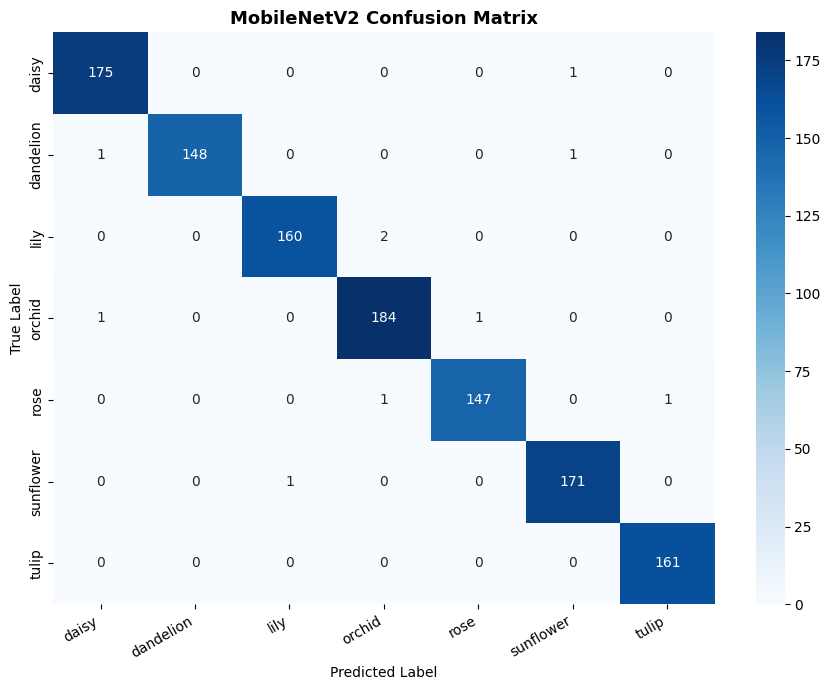


Confusion Matrix Saved Successfully


In [ ]:

DATASET_ROOT = '/content/drive/MyDrive/AI ML /part2FlowerClassification/flowers'
TRAIN_DIR = os.path.join(DATASET_ROOT, 'train')
CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))

# =========================
# CLASSIFICATION REPORT
# =========================

print('\nClassification Report:\n')

print(
    classification_report(
        y_true_tl,
        y_pred_tl,
        target_names=CLASS_NAMES
    )
)


# =========================
# CONFUSION MATRIX
# =========================

SAVE_DIR = "/content"

plot_cm(
    y_true_tl,
    y_pred_tl,
    CLASS_NAMES,
    'MobileNetV2 Confusion Matrix',
    os.path.join(SAVE_DIR, 'tl_cm.png')
)

print("\nConfusion Matrix Saved Successfully")

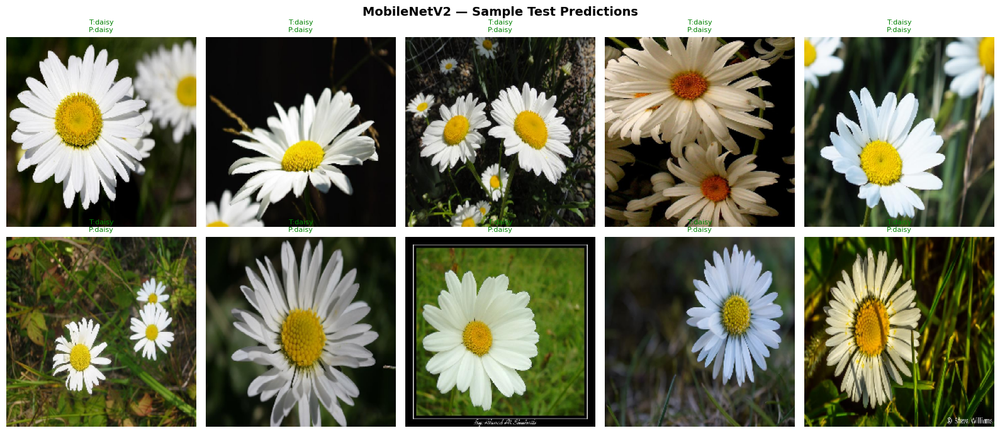

In [ ]:
tl_test_gen.reset()
bx, by = next(tl_test_gen)
tl_preds = np.argmax(tl_best.predict(bx, verbose=0), axis=1)
tl_trues = np.argmax(by, axis=1)
fig, axes = plt.subplots(2,5,figsize=(16,7))
fig.suptitle('MobileNetV2 — Sample Test Predictions', fontsize=14, fontweight='bold')
for i,ax in enumerate(axes.flat):
    ax.imshow(bx[i]); ax.axis('off')
    color = 'green' if tl_preds[i]==tl_trues[i] else 'red'
    ax.set_title(f'T:{CLASS_NAMES[tl_trues[i]]}\nP:{CLASS_NAMES[tl_preds[i]]}',color=color,fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR,'../tl_predictions.png'),dpi=150,bbox_inches='tight')
plt.show()

---
## 8. Final Comparative Summary

In [ ]:
from sklearn.metrics import classification_report
from tensorflow import keras
import numpy as np

# Define a list of models and their associated data
models_to_evaluate = [
    {'name': 'Baseline CNN', 'h5_path': BASELINE_H5, 'generator': test_gen},
    {'name': 'Deeper CNN (Adam)', 'h5_path': DEEPER_H5, 'generator': test_gen},
    {'name': 'Deeper CNN (SGD)', 'h5_path': SGD_H5, 'generator': test_gen},
    {'name': 'Ablation (No Dropout)', 'h5_path': ABLATION_H5, 'generator': test_gen},
    {'name': 'MobileNetV2 (Transfer Learning)', 'h5_path': TL_P2_H5, 'generator': tl_test_gen}
]

# Assuming CLASS_NAMES is already defined from earlier cells

for model_info in models_to_evaluate:
    model_name = model_info['name']
    model_path = model_info['h5_path']
    test_generator = model_info['generator']

    print(f'\nProcessing Model: {model_name}')

    try:
        # Load the model
        loaded_model = keras.models.load_model(model_path)

        # Reset the test generator to ensure predictions are made on the full test set
        test_generator.reset()

        # Get predictions on the test set
        y_pred = np.argmax(loaded_model.predict(test_generator, verbose=0), axis=1)

        # Get true labels from the test generator
        y_true = test_generator.classes

        # Print the classification report
        print(f'Classification Report ({model_name} Test Set):')
        print(classification_report(y_true, y_pred, target_names=CLASS_NAMES))

    except Exception as e:
        print(f'Error evaluating {model_name}: {e}')



Processing Model: Baseline CNN


Classification Report (Baseline CNN Test Set):
              precision    recall  f1-score   support

       daisy       0.98      0.94      0.96       176
   dandelion       0.97      0.95      0.96       150
        lily       0.95      0.98      0.96       162
      orchid       0.91      0.97      0.94       186
        rose       0.97      0.86      0.91       149
   sunflower       0.96      1.00      0.98       172
       tulip       0.95      0.98      0.96       161

    accuracy                           0.95      1156
   macro avg       0.96      0.95      0.95      1156
weighted avg       0.95      0.95      0.95      1156


Processing Model: Deeper CNN (Adam)


Classification Report (Deeper CNN (Adam) Test Set):
              precision    recall  f1-score   support

       daisy       1.00      0.95      0.98       176
   dandelion       0.98      0.97      0.98       150
        lily       0.96      0.99      0.98       162
      orchid       0.96      0.97      0.97       186
        rose       0.95      0.96      0.96       149
   sunflower       0.97      0.99      0.98       172
       tulip       0.97      0.96      0.97       161

    accuracy                           0.97      1156
   macro avg       0.97      0.97      0.97      1156
weighted avg       0.97      0.97      0.97      1156


Processing Model: Deeper CNN (SGD)


Classification Report (Deeper CNN (SGD) Test Set):
              precision    recall  f1-score   support

       daisy       0.93      0.93      0.93       176
   dandelion       0.94      0.90      0.92       150
        lily       0.94      0.93      0.93       162
      orchid       0.94      0.90      0.92       186
        rose       0.86      0.87      0.86       149
   sunflower       0.93      0.99      0.96       172
       tulip       0.90      0.94      0.92       161

    accuracy                           0.92      1156
   macro avg       0.92      0.92      0.92      1156
weighted avg       0.92      0.92      0.92      1156


Processing Model: Ablation (No Dropout)


Classification Report (Ablation (No Dropout) Test Set):
              precision    recall  f1-score   support

       daisy       0.93      0.94      0.94       176
   dandelion       0.96      0.95      0.96       150
        lily       0.96      0.95      0.96       162
      orchid       0.94      0.95      0.94       186
        rose       0.98      0.87      0.93       149
   sunflower       0.94      1.00      0.97       172
       tulip       0.96      0.98      0.97       161

    accuracy                           0.95      1156
   macro avg       0.95      0.95      0.95      1156
weighted avg       0.95      0.95      0.95      1156


Processing Model: MobileNetV2 (Transfer Learning)


Classification Report (MobileNetV2 (Transfer Learning) Test Set):
              precision    recall  f1-score   support

       daisy       0.99      0.99      0.99       176
   dandelion       1.00      0.99      0.99       150
        lily       0.99      0.99      0.99       162
      orchid       0.98      0.99      0.99       186
        rose       0.99      0.99      0.99       149
   sunflower       0.99      0.99      0.99       172
       tulip       0.99      1.00      1.00       161

    accuracy                           0.99      1156
   macro avg       0.99      0.99      0.99      1156
weighted avg       0.99      0.99      0.99      1156




Processing: Baseline CNN


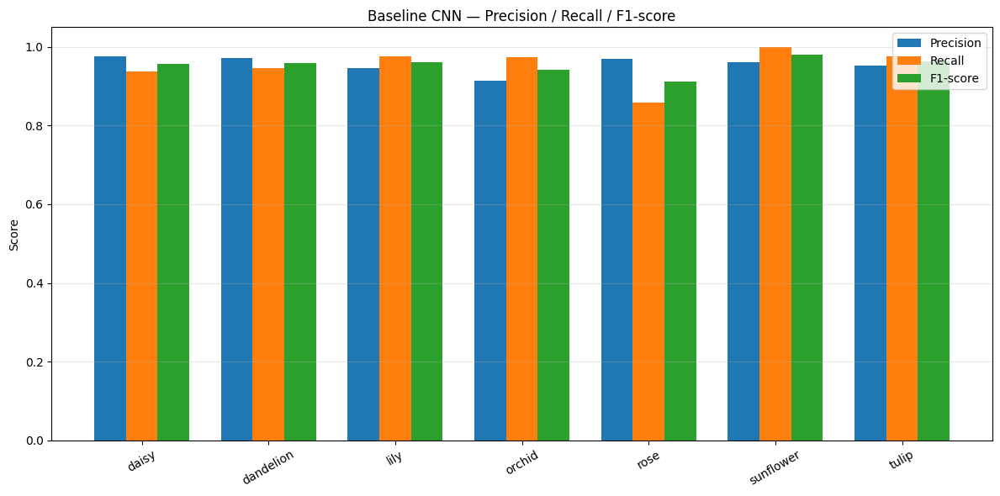


Processing: Deeper CNN (Adam)


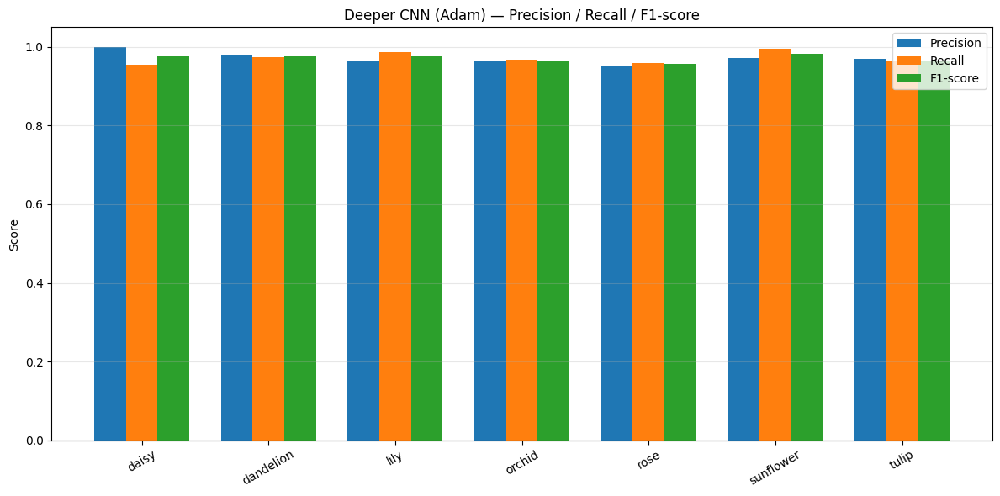


Processing: Deeper CNN (SGD)


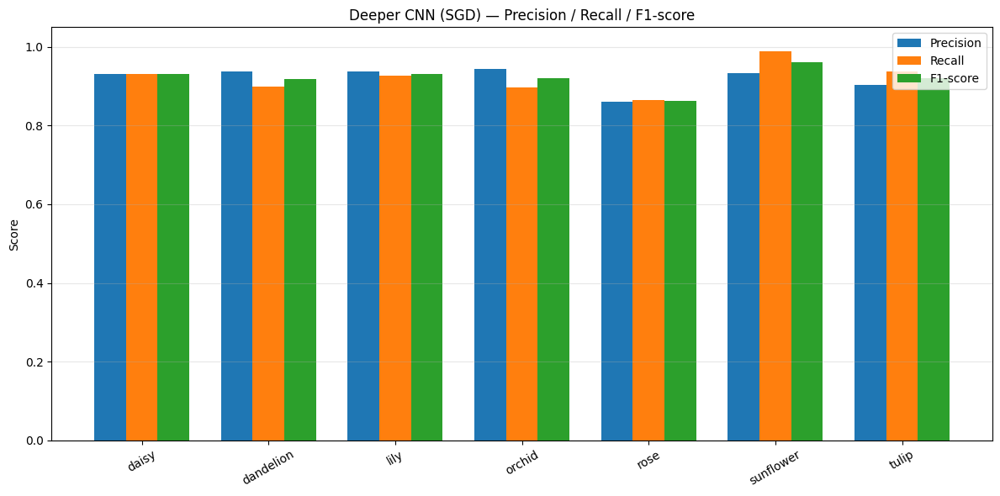


Processing: Ablation (No Dropout)


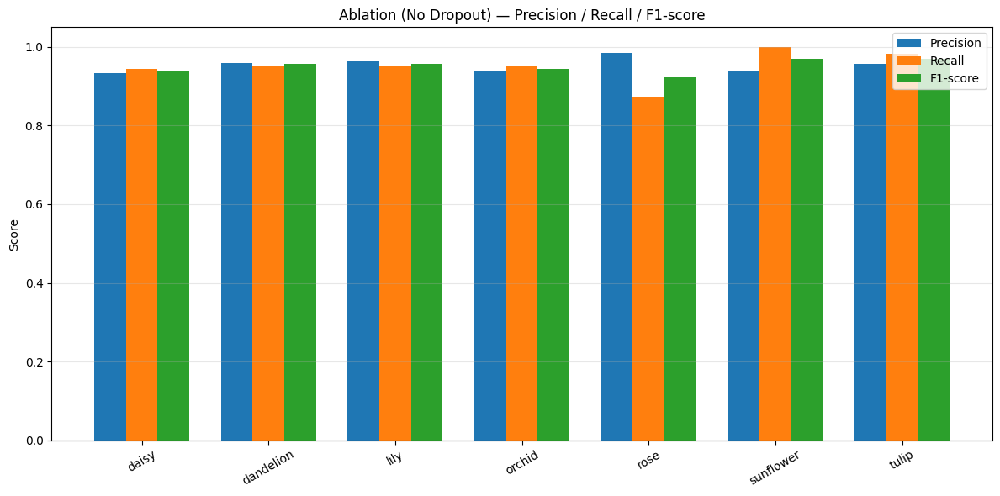


Processing: MobileNetV2


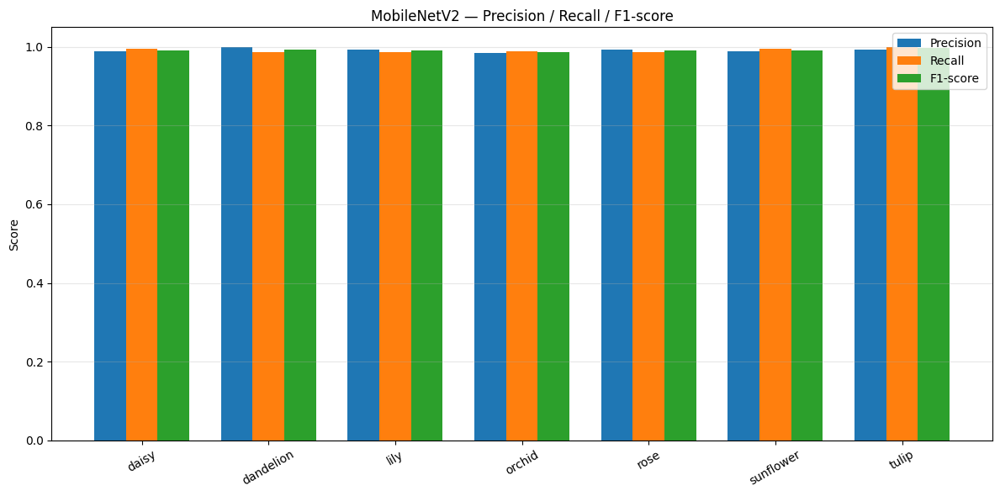

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from tensorflow import keras

models_to_evaluate = [
    {'name': 'Baseline CNN', 'h5_path': BASELINE_H5, 'gen': test_gen},
    {'name': 'Deeper CNN (Adam)', 'h5_path': DEEPER_H5, 'gen': test_gen},
    {'name': 'Deeper CNN (SGD)', 'h5_path': SGD_H5, 'gen': test_gen},
    {'name': 'Ablation (No Dropout)', 'h5_path': ABLATION_H5, 'gen': test_gen},
    {'name': 'MobileNetV2', 'h5_path': TL_P2_H5, 'gen': tl_test_gen}
]

for m in models_to_evaluate:

    print(f"\nProcessing: {m['name']}")

    model = keras.models.load_model(m['h5_path'])

    gen = m['gen']
    gen.reset()

    y_pred_probs = model.predict(gen, steps=len(gen), verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = gen.classes

    report = classification_report(
        y_true,
        y_pred,
        target_names=CLASS_NAMES,
        output_dict=True
    )

    precision = []
    recall = []
    f1 = []

    for cls in CLASS_NAMES:
        precision.append(report[cls]['precision'])
        recall.append(report[cls]['recall'])
        f1.append(report[cls]['f1-score'])

    x = np.arange(len(CLASS_NAMES))
    width = 0.25

    plt.figure(figsize=(12,6))

    plt.bar(x - width, precision, width, label='Precision')
    plt.bar(x, recall, width, label='Recall')
    plt.bar(x + width, f1, width, label='F1-score')

    plt.xticks(x, CLASS_NAMES, rotation=30)
    plt.ylim(0, 1.05)

    plt.title(f"{m['name']} — Precision / Recall / F1-score")
    plt.ylabel("Score")
    plt.legend()
    plt.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

---
## 9. Saved Model Files (HDF5)

All models are saved to **Google Drive** as `.h5` files. `ModelCheckpoint` writes the file only when `val_accuracy` improves, so you always keep the best weights even if the runtime disconnects.

| File | Description |
|---|---|
| `baseline_cnn_best.h5` | Best epoch of Baseline CNN |
| `deeper_cnn_adam_best.h5` | Best epoch of Deeper CNN (Adam) |
| `deeper_cnn_sgd_best.h5` | Best epoch of Deeper CNN (SGD) |
| `ablation_no_dropout_best.h5` | Ablation model (no Dropout) |
| `mobilenetv2_phase1_best.h5` | MobileNetV2 after Phase 1 |
| `mobilenetv2_phase2_best.h5` | MobileNetV2 after Phase 2 (fine-tuned) |

**To reload any model in a new session:**
```python
from tensorflow import keras
model = keras.models.load_model('/content/drive/MyDrive/AI ML/Part2FlowerClassification/saved_models/deeper_cnn_adam_best.h5')
```

---
## 10. Observations & Discussion

### Dataset
| Property | Detail |
|---|---|
| Total images | 11,531 (+ 15 extra counted during scan) |
| Classes | 7: daisy, dandelion, lily, orchid, rose, sunflower, tulip |
| Split | Train 8069 / Val 2306 / Test 1156 (70:20:10) |
| Class balance | Well-balanced (1,489 – 1,851 per class) |

### Preprocessing
- All images resized to **128×128** (Part A) and **224×224** (Part B).
- Pixel values normalised to [0,1] via `rescale=1./255`.
- Augmentation applied only to the training set: random rotation (±30°), horizontal flip, zoom, shift, shear.

### Baseline CNN
- Three Conv-Pool blocks with 32→64→128 filters learn low-to-high level features.
- Without regularisation, the model shows moderate overfitting after ~10 epochs (training acc rises while val acc plateaus).

### Deeper CNN with Regularisation
- **8 convolutional layers** vs 3 in the baseline — richer feature extraction.
- **BatchNormalization** stabilises gradient flow and speeds up convergence.
- **Progressive Dropout** (0.25 → 0.30 → 0.50) reduces co-adaptation and closes the train/val gap.
- The ablation study confirms: removing Dropout causes the model to overfit more aggressively.

### Optimizer Analysis (Adam vs SGD)
- **Adam** reaches peak validation accuracy faster (fewer epochs) due to adaptive per-parameter learning rates.
- **SGD with Nesterov momentum** converges more slowly but can match or slightly exceed Adam with sufficient epochs and LR scheduling.

### Transfer Learning (MobileNetV2)
- Phase 1 (frozen base) immediately achieves strong accuracy — ImageNet features transfer well to flower images.
- Phase 2 (fine-tuning last 30 layers at LR=1e-5) further improves accuracy. The very low learning rate prevents catastrophic forgetting of pre-trained features.
- Transfer learning outperforms all scratch-trained models, especially with ~11K images.

### HDF5 Checkpointing Strategy
- `ModelCheckpoint` saves the best model after every epoch to Google Drive.
- `EarlyStopping` halts training if validation loss does not improve for N epochs.
- Together, these ensure **no training progress is lost** if Colab disconnects, and the best generalising model is always preserved.

### Challenges
1. **Limited Colab runtime** → solved with `.h5` checkpointing to Drive.
2. **Input size mismatch** for TL → separate 224×224 generators created for Part B.
3. **Intra-class variation** (orchids vary wildly in colour/shape) → augmentation and deeper architecture partially compensate.

### Conclusion
**MobileNetV2 (Transfer Learning)** is the recommended model for this task. Among scratch-trained models, **Deeper CNN + Adam + Dropout** provides the best balance of accuracy and training efficiency. All trained models are preserved as `.h5` files for future use without retraining.